In [1]:
import os, tarfile, glob, pathlib

tar_path = r"C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW.tar"
out_dir  = r"C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted"

os.makedirs(out_dir, exist_ok=True)

print("TAR exists:", os.path.exists(tar_path))
print("Extract to:", out_dir)

# 解压（如果已解压过，这步可以跳过；不确定就先跑，会覆盖同名文件）
with tarfile.open(tar_path, "r") as tar:
    tar.extractall(path=out_dir)

# 列出前100个文件（按路径排序）
all_files = sorted([str(p) for p in pathlib.Path(out_dir).rglob("*") if p.is_file()])
print("Total files:", len(all_files))
print("\n".join(all_files[:100]))

TAR exists: True
Extract to: C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted
Total files: 63
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775561_AD1_barcodes.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775561_AD1_features.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775561_AD1_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775562_AD2_barcodes.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775562_AD2_features.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775562_AD2_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775563_AD4_barcodes.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775563_AD4_features.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775563_AD4_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775564_AD5_barcodes.tsv.gz
C:\Users\1391

In [2]:
import re
from collections import Counter

suffixes = [pathlib.Path(f).suffixes for f in all_files]
# suffixes是类似 ['.mtx', '.gz'] 的列表，拼起来更直观
suffix_join = ["".join(s) for s in suffixes]
cnt = Counter(suffix_join)
print("Top suffix patterns:")
for k,v in cnt.most_common(20):
    print(v, k)

# 看看是否像10x格式（features/barcodes/matrix）
hits = [f for f in all_files if re.search(r"(matrix\.mtx|barcodes\.tsv|features\.tsv|genes\.tsv)", f)]
print("\nPossible 10x-related files (first 30):")
print("\n".join(hits[:30]))

Top suffix patterns:
42 .tsv.gz
21 .mtx.gz

Possible 10x-related files (first 30):
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775561_AD1_barcodes.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775561_AD1_features.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775561_AD1_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775562_AD2_barcodes.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775562_AD2_features.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775562_AD2_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775563_AD4_barcodes.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775563_AD4_features.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775563_AD4_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775564_AD5_barcodes.tsv.gz
C:\Users\13918\Desktop\Aging2\GEO

In [3]:
import os, re, glob, pandas as pd

base_dir = r"C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted"

matrix_files = sorted(glob.glob(os.path.join(base_dir, "*_matrix.mtx.gz")))
print("matrix files:", len(matrix_files))
print("\n".join(matrix_files[:5]))

rows = []
for m in matrix_files:
    prefix = re.sub(r"_matrix\.mtx\.gz$", "", os.path.basename(m))
    rows.append({
        "prefix": prefix,
        "matrix": m,
        "barcodes": os.path.join(base_dir, prefix + "_barcodes.tsv.gz"),
        "features": os.path.join(base_dir, prefix + "_features.tsv.gz"),
    })

samples = pd.DataFrame(rows)
samples["barcodes_exists"] = samples["barcodes"].map(os.path.exists)
samples["features_exists"] = samples["features"].map(os.path.exists)

# 简单从prefix推断分组（后面如果你有更准确的meta，再替换）
samples["condition"] = samples["prefix"].apply(lambda x: "AD" if "_AD" in x else "control")

display(samples.head(10))
print("All barcodes exist:", samples["barcodes_exists"].all())
print("All features exist:", samples["features_exists"].all())
print(samples["condition"].value_counts())

matrix files: 21
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775561_AD1_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775562_AD2_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775563_AD4_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775564_AD5_matrix.mtx.gz
C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RAW_extracted\GSM4775565_AD6_matrix.mtx.gz


,prefix,matrix,barcodes,features,barcodes_exists,features_exists,condition
0,GSM4775561_AD1,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
1,GSM4775562_AD2,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
2,GSM4775563_AD4,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
3,GSM4775564_AD5,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
4,GSM4775565_AD6,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
5,GSM4775566_AD8,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
6,GSM4775567_AD9,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
7,GSM4775568_AD10,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
8,GSM4775569_AD13,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD
9,GSM4775570_AD19,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,C:\Users\13918\Desktop\Aging2\GEO\GSE157827_RA...,True,True,AD


All barcodes exist: True
All features exist: True
condition
AD         12
control     9
Name: count, dtype: int64


In [4]:
import gzip
import numpy as np
import pandas as pd
from scipy.io import mmread
import anndata as ad

def read_one_sample(matrix_path, barcodes_path, features_path, sample_id, condition):
    # 读 features：一般是 3 列：gene_id, gene_name, feature_type
    feat = pd.read_csv(features_path, sep="\t", header=None)
    if feat.shape[1] >= 2:
        gene_ids = feat.iloc[:, 0].astype(str).values
        gene_names = feat.iloc[:, 1].astype(str).values
    else:
        gene_ids = feat.iloc[:, 0].astype(str).values
        gene_names = gene_ids

    # 读 barcodes
    bar = pd.read_csv(barcodes_path, sep="\t", header=None)
    barcodes = bar.iloc[:, 0].astype(str).values

    # 读 mtx（10x 为 genes x cells）
    with gzip.open(matrix_path, "rb") as f:
        X = mmread(f).tocsr()

    # 转成 cells x genes
    X = X.T.tocsr()

    # 组装 AnnData
    adata = ad.AnnData(X=X)
    adata.obs_names = [f"{sample_id}#{bc}" for bc in barcodes]  # 保证全局唯一
    adata.var_names = pd.Index(gene_names).astype(str)
    adata.var["gene_id"] = gene_ids
    adata.obs["sample"] = sample_id
    adata.obs["condition"] = condition

    # var_names 可能重复，强制唯一（scanpy常用）
    adata.var_names_make_unique()

    return adata

adatas = []
for i, r in samples.iterrows():
    a = read_one_sample(r["matrix"], r["barcodes"], r["features"],
                        sample_id=r["prefix"], condition=r["condition"])
    print(r["prefix"], a.shape)
    adatas.append(a)

adata = ad.concat(adatas, join="outer", merge="same")  # 通常各样本基因集合一致
print("Merged adata:", adata.shape)
print(adata.obs["condition"].value_counts())

GSM4775561_AD1 (6243, 33538)
GSM4775562_AD2 (15357, 33538)
GSM4775563_AD4 (6166, 33538)
GSM4775564_AD5 (12362, 33538)
GSM4775565_AD6 (2990, 33538)
GSM4775566_AD8 (2654, 33538)
GSM4775567_AD9 (10229, 33538)
GSM4775568_AD10 (16156, 33538)
GSM4775569_AD13 (1829, 33538)
GSM4775570_AD19 (3794, 33538)
GSM4775571_AD20 (9208, 33538)
GSM4775572_AD21 (8472, 33538)
GSM4775573_NC3 (6327, 33538)
GSM4775574_NC7 (6483, 33538)
GSM4775575_NC11 (3576, 33538)
GSM4775576_NC12 (15692, 33538)
GSM4775577_NC14 (10983, 33538)
GSM4775578_NC15 (8416, 33538)
GSM4775579_NC16 (6348, 33538)
GSM4775580_NC17 (14491, 33538)
GSM4775581_NC18 (11616, 33538)
Merged adata: (179392, 33538)
condition
AD         95460
control    83932
Name: count, dtype: int64


In [5]:
out_h5ad = r"C:\Users\13918\Desktop\Aging2\GEO\GSE157827_merged_raw.h5ad"
adata.write_h5ad(out_h5ad)
print("Saved:", out_h5ad)

Saved: C:\Users\13918\Desktop\Aging2\GEO\GSE157827_merged_raw.h5ad


In [6]:
import scanpy as sc
import pandas as pd
import numpy as np

# 如果你已经在内存里有 adata，可跳过读取
# adata = sc.read_h5ad(r"C:\Users\13918\Desktop\Aging2\GEO\GSE157827_merged_raw.h5ad")

adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.upper().str.startswith(("RPL", "RPS"))

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt", "ribo"],
    percent_top=None,
    log1p=False,
    inplace=True
)

adata.obs[["total_counts","n_genes_by_counts","pct_counts_mt","pct_counts_ribo"]].head()

,total_counts,n_genes_by_counts,pct_counts_mt,pct_counts_ribo
GSM4775561_AD1#AAACCCAAGCTGAAAT-1,15864,4475,0.069339,0.182804
GSM4775561_AD1#AAACCCACAAATGGTA-1,3394,1909,0.147319,1.296405
GSM4775561_AD1#AAACCCACAATGAAAC-1,3136,1592,0.350765,0.255102
GSM4775561_AD1#AAACCCAGTAACCCTA-1,517,450,5.415861,0.580271
GSM4775561_AD1#AAACCCAGTAGCGAGT-1,3171,1764,0.157679,0.283822


In [7]:
adata.obs[["sample","condition"]].head()
print(adata.obs["condition"].value_counts())
print("n_cells:", adata.n_obs, "n_genes:", adata.n_vars)

condition
AD         95460
control    83932
Name: count, dtype: int64
n_cells: 179392 n_genes: 33538


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

The `scale` parameter has been renamed and 

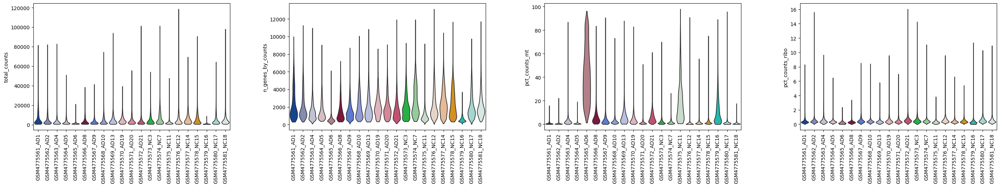

In [8]:
import scanpy as sc

sc.pl.violin(
    adata,
    keys=["total_counts","n_genes_by_counts","pct_counts_mt","pct_counts_ribo"],
    groupby="sample",
    rotation=90,
    stripplot=False,
    multi_panel=True
)

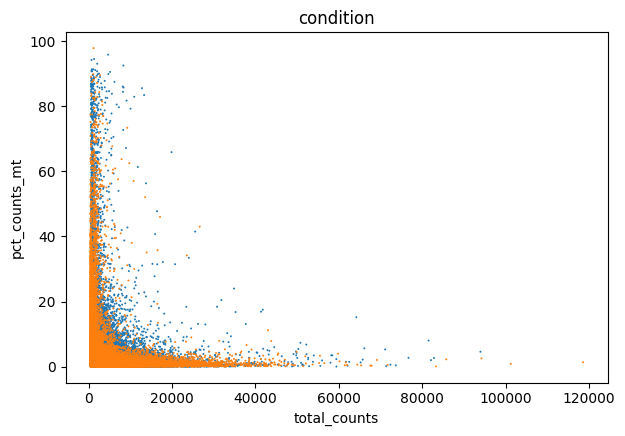

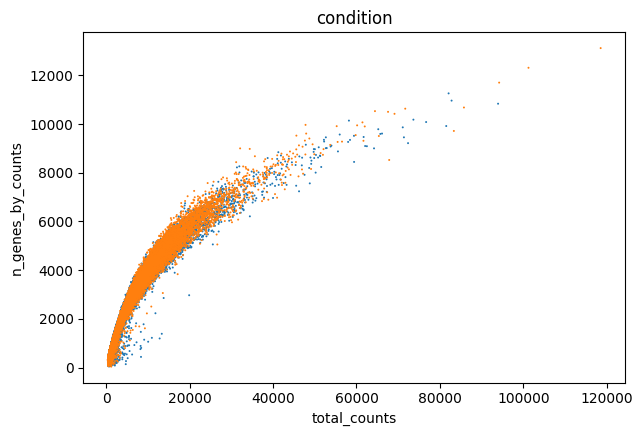

In [10]:
import numpy as np
import scanpy as sc

idx = np.random.choice(adata.n_obs, size=min(80000, adata.n_obs), replace=False)
adata_sub = adata[idx].copy()   # copy() 可避免 ImplicitModificationWarning

sc.pl.scatter(
    adata_sub,
    x="total_counts",
    y="pct_counts_mt",
    color="condition",
    size=8,
    legend_loc="none"   # 关键：不要创建legend，就不会触发 legendHandles
)

sc.pl.scatter(
    adata_sub,
    x="total_counts",
    y="n_genes_by_counts",
    color="condition",
    size=8,
    legend_loc="none"
)

In [11]:
import scanpy as sc
import pandas as pd
import numpy as np

print("Before filter:", adata.shape)

# 保存原始计数（后面DE/pseudobulk会用）
adata.layers["counts"] = adata.X.copy()

# 建议的第一轮阈值（可后续调整）
min_counts = 600
min_genes  = 400
max_genes  = 6500
max_mt     = 20

mask = (
    (adata.obs["total_counts"] >= min_counts) &
    (adata.obs["n_genes_by_counts"] >= min_genes) &
    (adata.obs["n_genes_by_counts"] <= max_genes) &
    (adata.obs["pct_counts_mt"] < max_mt)
)

adata_f = adata[mask].copy()
print("After cell filter:", adata_f.shape)

Before filter: (179392, 33538)
After cell filter: (163824, 33538)


In [12]:
# 基因至少在10个细胞表达
sc.pp.filter_genes(adata_f, min_cells=10)
print("After gene filter:", adata_f.shape)

# 重新算一次qc（基因过滤后更严谨；不重算也能用）
adata_f.var["mt"] = adata_f.var_names.str.upper().str.startswith("MT-")
adata_f.var["ribo"] = adata_f.var_names.str.upper().str.startswith(("RPL", "RPS"))

sc.pp.calculate_qc_metrics(adata_f, qc_vars=["mt","ribo"], percent_top=None, log1p=False, inplace=True)

After gene filter: (163824, 28231)


In [13]:
cond_map = adata.obs.groupby("sample")["condition"].first()

before = adata.obs.groupby("sample").size().rename("before")
after  = adata_f.obs.groupby("sample").size().rename("after")

keep_rate = pd.concat([before, after], axis=1).fillna(0)
keep_rate["keep_rate"] = keep_rate["after"] / keep_rate["before"]
keep_rate["condition"] = keep_rate.index.map(cond_map)

display(keep_rate.sort_values("keep_rate").head(10))
print("Total kept cells:", int(adata_f.n_obs))

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\3729394772.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cond_map = adata.obs.groupby("sample")["condition"].first()
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\3729394772.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  before = adata.obs.groupby("sample").size().rename("before")
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\3729394772.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future 

,before,after,keep_rate,condition
sample,,,,
GSM4775565_AD6,2990,442,0.147826,AD
GSM4775579_NC16,6348,3227,0.508349,control
GSM4775575_NC11,3576,1917,0.536074,control
GSM4775569_AD13,1829,1610,0.880262,AD
GSM4775566_AD8,2654,2357,0.888093,AD
GSM4775567_AD9,10229,9452,0.924039,AD
GSM4775563_AD4,6166,5702,0.924749,AD
GSM4775572_AD21,8472,7861,0.927880,AD
GSM4775561_AD1,6243,5810,0.930642,AD


Total kept cells: 163824


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_anndata.py:840: FutureWarning: 

The `scale` parameter has been renamed and 

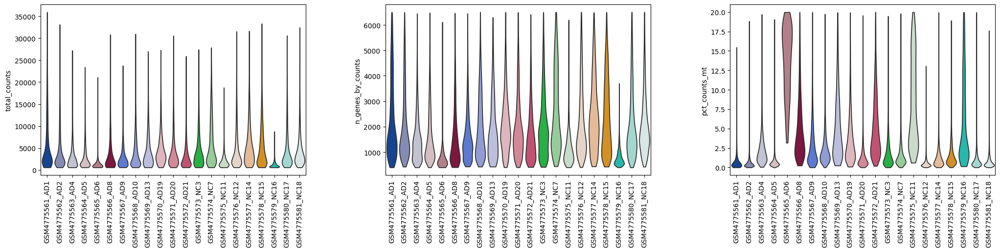

In [14]:
sc.pl.violin(
    adata_f,
    keys=["total_counts","n_genes_by_counts","pct_counts_mt"],
    groupby="sample",
    rotation=90,
    stripplot=False,
    multi_panel=True
)

In [15]:
import scanpy as sc

in_h5ad = r"C:\Users\13918\Desktop\Aging2\GEO\GSE157827_filtered.h5ad"
adata = sc.read_h5ad(in_h5ad)

print(adata)
print(adata.obs["condition"].value_counts())
print(adata.obs["sample"].nunique())

AnnData object with n_obs × n_vars = 163824 × 28231
    obs: 'sample', 'condition', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_id', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'sample_colors'
    layers: 'counts'
condition
AD         87784
control    76040
Name: count, dtype: int64
21


In [16]:
# normalize + log
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# 保存一份 log-normalized 的全基因矩阵到 raw（后面找marker默认会用）
adata.raw = adata

In [17]:
import scanpy as sc

# 如果需要：先把原始log-normalized存到raw（后面找marker用）
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

In [18]:
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat",
    n_top_genes=3000,
    batch_key="sample"
)

print("HVG n =", int(adata.var["highly_variable"].sum()))

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to Tru

HVG n = 3000


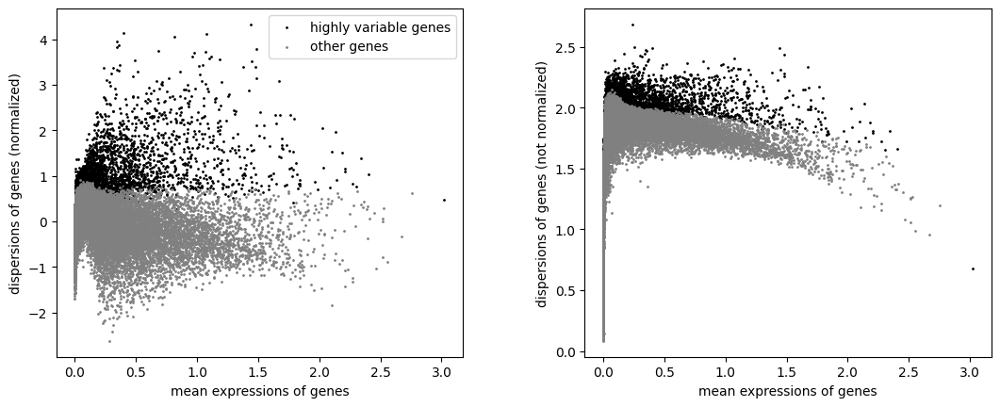

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
sc.tl.pca(
    adata,
    n_comps=50,
    use_highly_variable=True,
    svd_solver="randomized",
    zero_center=False
)

In [21]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50)
sc.tl.umap(adata)

sc.tl.leiden(adata, resolution=0.8, key_added="leiden")
print(adata.obs["leiden"].value_counts().head())

leiden
0    23872
1    22098
2    16429
3    15565
4    10182
Name: count, dtype: int64


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map)

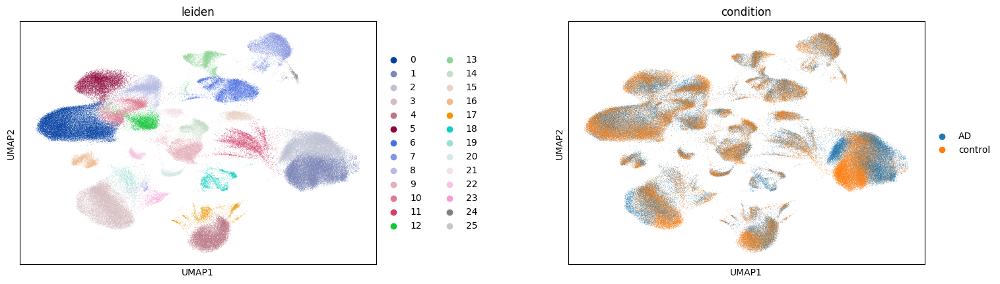

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


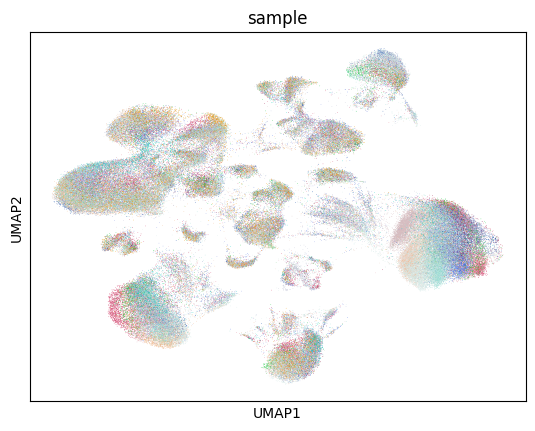

In [22]:
sc.pl.umap(adata, color=["leiden", "condition"], wspace=0.4)
sc.pl.umap(adata, color=["sample"], legend_loc="none")

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map)

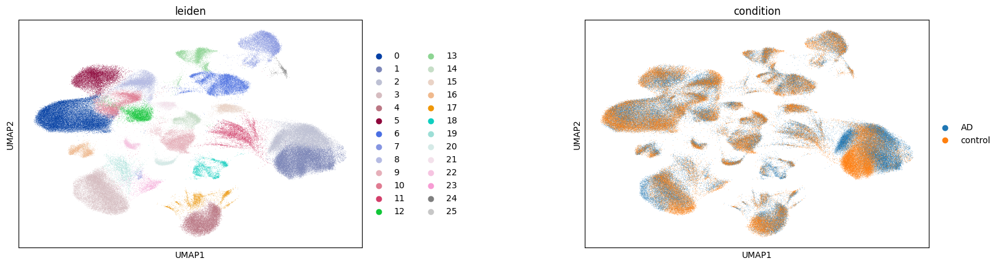

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


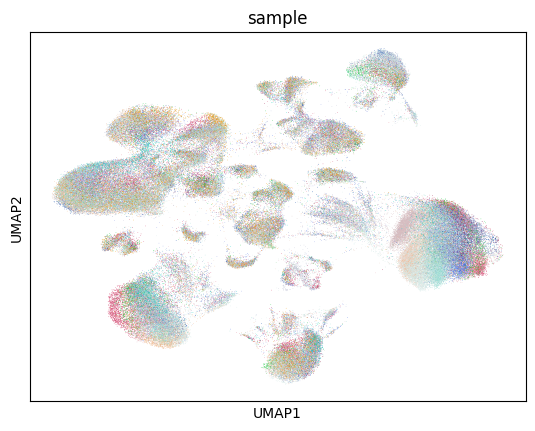

In [30]:
import scanpy as sc

sc.pl.umap(adata, color=["leiden", "condition"], wspace=0.5)
sc.pl.umap(adata, color=["sample"], legend_loc="none")

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map)

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


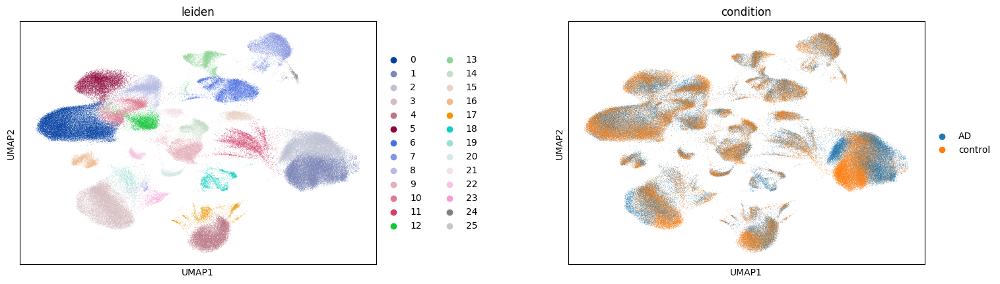

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


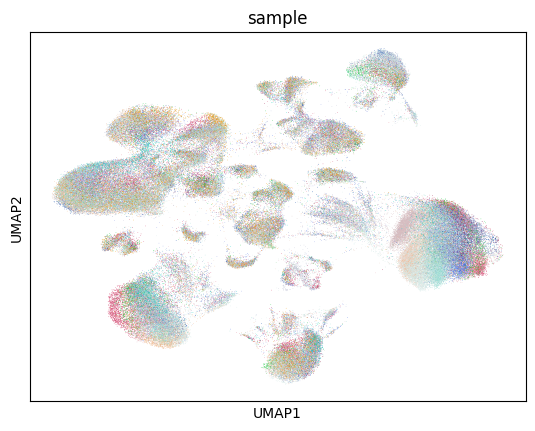

In [29]:
import scanpy as sc

sc.settings.figdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures"
sc.settings.file_format_figs = "png"   # 输出png

sc.pl.umap(adata, color=["leiden", "condition"], wspace=0.4, save="_leiden_condition")
sc.pl.umap(adata, color=["sample"], legend_loc="none", save="_sample")

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\tools\_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` 

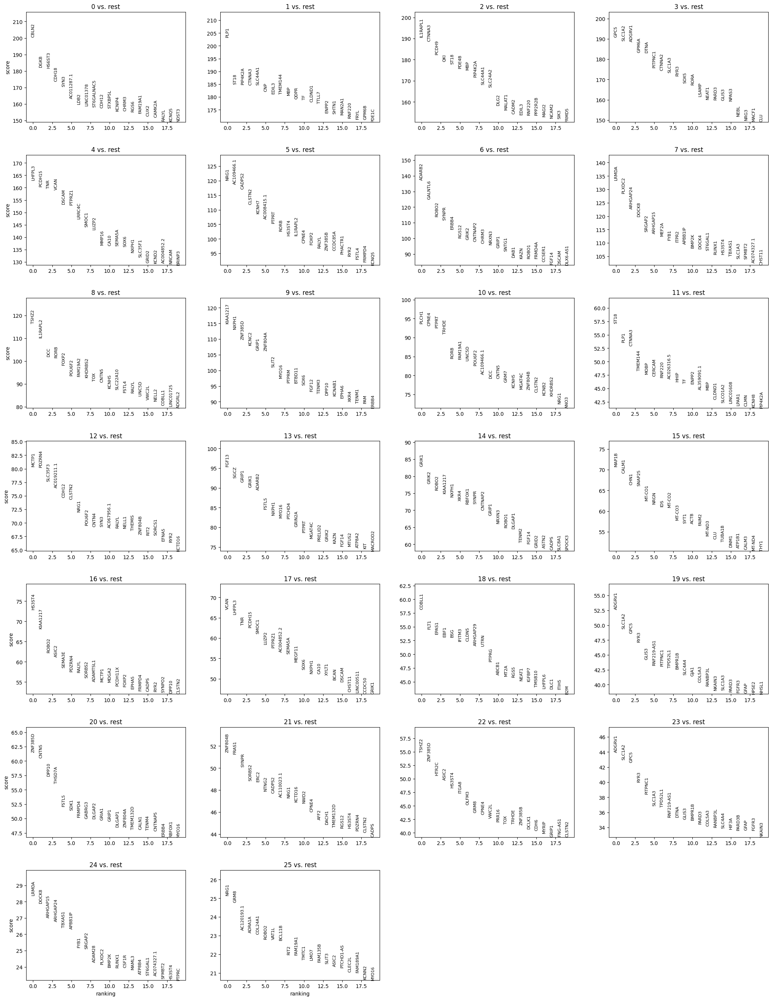

In [24]:
sc.tl.rank_genes_groups(
    adata,
    groupby="leiden",
    method="wilcoxon",
    use_raw=True,   # 使用 adata.raw（log-normalized 全基因）
    n_genes=50
)

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [25]:
markers_df = sc.get.rank_genes_groups_df(adata, group=None)
markers_df.head(10)

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\get\get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,CBLN2,200.493149,4.150932,0.0,0.0
1,0,DGKB,182.402512,2.771329,0.0,0.0
2,0,HS6ST3,181.883530,2.780693,0.0,0.0
3,0,CDH18,173.730743,2.588206,0.0,0.0
4,0,SYN3,170.624420,2.810788,0.0,0.0
5,0,AC011287.1,163.348495,3.570344,0.0,0.0
6,0,LDB2,159.995209,2.543871,0.0,0.0
7,0,LINC01378,159.147186,3.732845,0.0,0.0
8,0,ST6GALNAC5,158.155151,2.691751,0.0,0.0
9,0,CDH12,157.596176,2.734502,0.0,0.0


In [26]:
out_csv = r"C:\Users\13918\Desktop\Aging2\GEO\markers_by_leiden.csv"
markers_df.to_csv(out_csv, index=False)
print("Saved:", out_csv)

Saved: C:\Users\13918\Desktop\Aging2\GEO\markers_by_leiden.csv


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

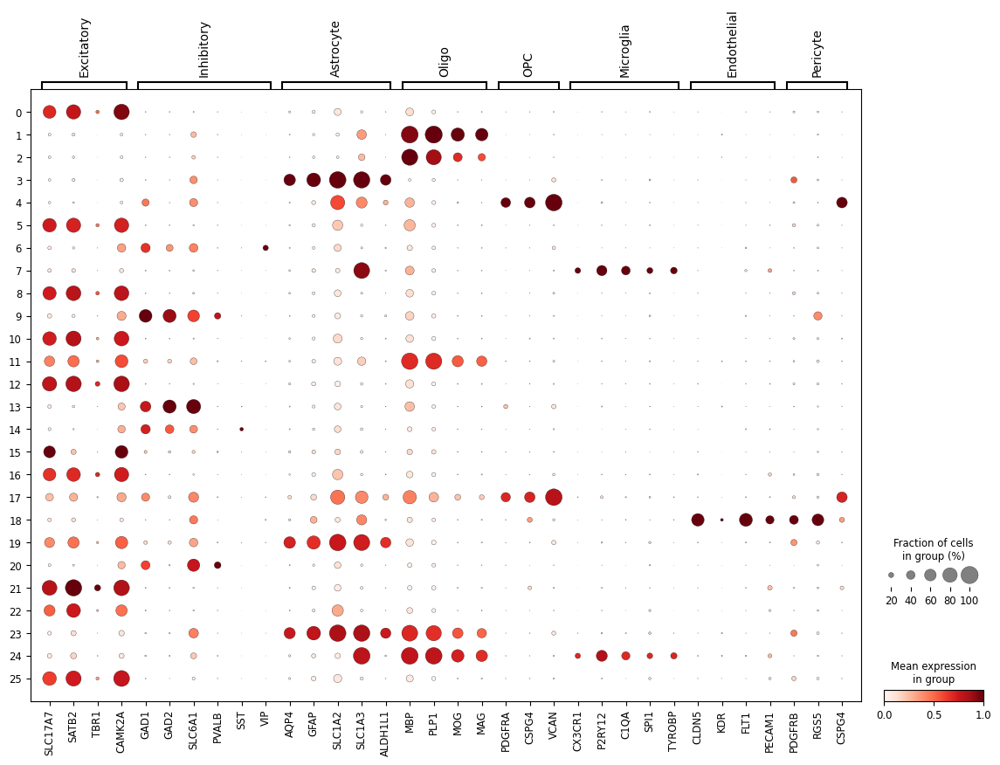

In [27]:
marker_dict = {
    "Excitatory": ["SLC17A7", "SATB2", "TBR1", "CAMK2A"],
    "Inhibitory": ["GAD1", "GAD2", "SLC6A1", "PVALB", "SST", "VIP"],
    "Astrocyte":  ["AQP4", "GFAP", "SLC1A2", "SLC1A3", "ALDH1L1"],
    "Oligo":      ["MBP", "PLP1", "MOG", "MAG"],
    "OPC":        ["PDGFRA", "CSPG4", "VCAN"],
    "Microglia":  ["CX3CR1", "P2RY12", "C1QA", "SPI1", "TYROBP"],
    "Endothelial":["CLDN5", "KDR", "FLT1", "PECAM1"],
    "Pericyte":   ["PDGFRB", "RGS5", "CSPG4"],
}

sc.pl.dotplot(adata, marker_dict, groupby="leiden", standard_scale="var")

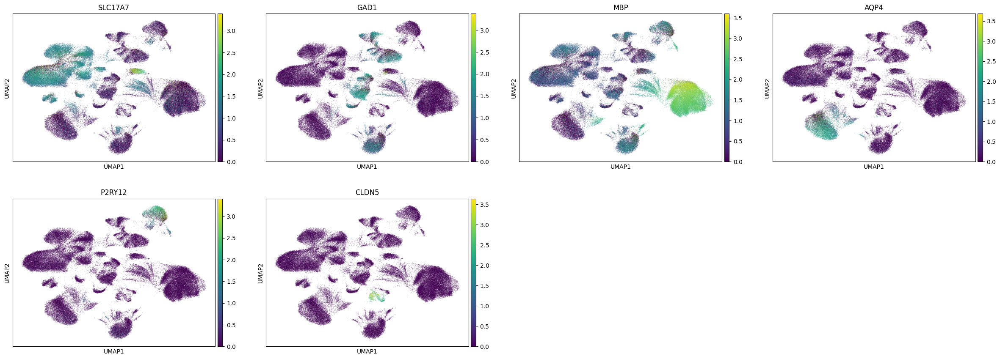

In [28]:
sc.pl.umap(
    adata,
    color=["SLC17A7","GAD1","MBP","AQP4","P2RY12","CLDN5"],
    gene_symbols=None
)

In [31]:
import numpy as np
import pandas as pd
import scanpy as sc

# 保险起见：确保leiden是字符串（你的字典key是"0"..."25"）
adata.obs["leiden"] = adata.obs["leiden"].astype(str)

cluster2type = {
    "0":  "Excitatory",
    "1":  "Oligo",
    "2":  "Oligo",
    "3":  "Astrocyte",
    "4":  "OPC",
    "5":  "Excitatory",
    "6":  "Inhibitory",
    "7":  "Microglia",
    "8":  "Excitatory",
    "9":  "Inhibitory",
    "10": "Excitatory",
    "11": "Oligo",
    "12": "Excitatory",
    "13": "Inhibitory",
    "14": "Inhibitory",
    "15": "Excitatory",
    "16": "Excitatory",
    "17": "OPC",
    "18": "Endothelial",  # 若想更宽泛可改成 "Vascular"
    "19": "Astrocyte",
    "20": "Inhibitory",
    "21": "Excitatory",
    "22": "Excitatory",
    "23": "Astrocyte",
    "24": "Oligo",
    "25": "Excitatory"
}

adata.obs["celltype"] = adata.obs["leiden"].map(cluster2type)

# 检查是否有漏标（出现NaN就说明字典没覆盖某些cluster）
missing = adata.obs.loc[adata.obs["celltype"].isna(), "leiden"].unique()
print("Missing clusters (should be empty):", missing)

adata.obs["celltype"] = adata.obs["celltype"].astype("category")

# 看各细胞类型细胞数
print(adata.obs["celltype"].value_counts())

Missing clusters (should be empty): []
celltype
Excitatory     56483
Oligo          44024
Inhibitory     22790
Astrocyte      18691
OPC            12421
Microglia       7261
Endothelial     2154
Name: count, dtype: int64


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map)

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


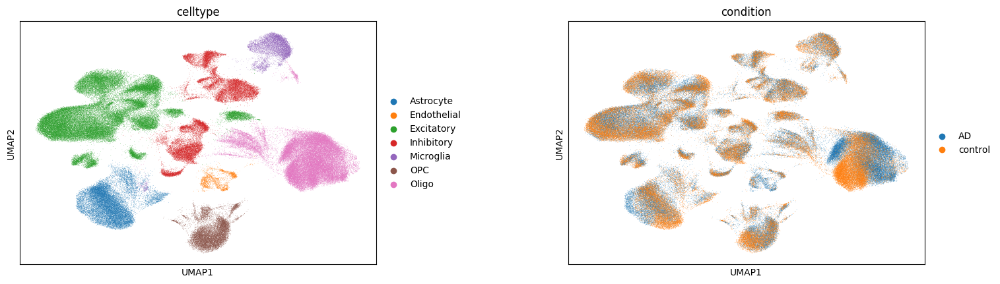

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


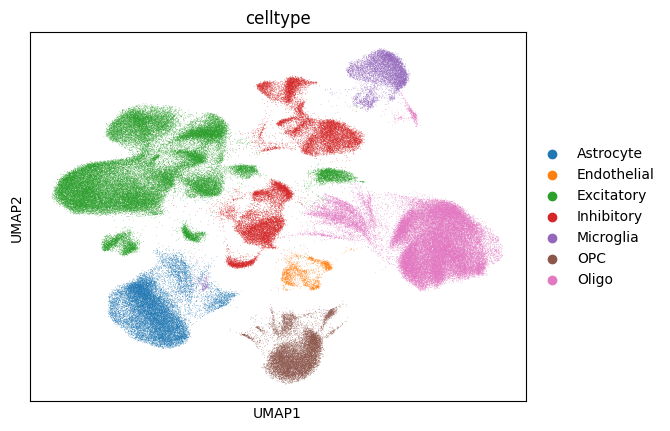

In [32]:
sc.settings.figdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures"
sc.settings.file_format_figs = "png"

sc.pl.umap(adata, color=["celltype", "condition"], wspace=0.4, save="_celltype_condition")
sc.pl.umap(adata, color=["celltype"], save="_celltype")

In [33]:
ctab = pd.crosstab(adata.obs["condition"], adata.obs["celltype"])
prop = ctab.div(ctab.sum(axis=1), axis=0)
display(ctab)
display(prop)

celltype,Astrocyte,Endothelial,Excitatory,Inhibitory,Microglia,OPC,Oligo
condition,,,,,,,
AD,10052,1608,29631,11784,3693,6460,24556
control,8639,546,26852,11006,3568,5961,19468


celltype,Astrocyte,Endothelial,Excitatory,Inhibitory,Microglia,OPC,Oligo
condition,,,,,,,
AD,0.114508,0.018318,0.337544,0.134239,0.042069,0.073590,0.279732
control,0.113611,0.007180,0.353130,0.144740,0.046923,0.078393,0.256023


In [34]:
ctab_s = pd.crosstab(adata.obs["sample"], adata.obs["celltype"])
prop_s = ctab_s.div(ctab_s.sum(axis=1), axis=0)
display(prop_s.head())

celltype,Astrocyte,Endothelial,Excitatory,Inhibitory,Microglia,OPC,Oligo
sample,,,,,,,
GSM4775561_AD1,0.052151,0.011360,0.292083,0.151979,0.067470,0.047849,0.377108
GSM4775562_AD2,0.138419,0.001354,0.229593,0.131244,0.046636,0.054217,0.398538
GSM4775563_AD4,0.141003,0.118204,0.290951,0.065766,0.086286,0.085584,0.212206
GSM4775564_AD5,0.030568,0.003057,0.386601,0.123546,0.002208,0.041522,0.412499
GSM4775565_AD6,0.235294,0.054299,0.352941,0.149321,0.000000,0.174208,0.033937


In [35]:
import scipy.sparse as sp

# 确保用原始counts层
X = adata.layers["counts"]
if not sp.issparse(X):
    X = sp.csr_matrix(X)

# 为了聚合方便
obs = adata.obs[["sample", "condition", "celltype"]].copy()

# 生成 group id：sample|celltype
obs["group"] = obs["sample"].astype(str) + "|" + obs["celltype"].astype(str)

groups = obs["group"].astype("category")
group_codes = groups.cat.codes.values
group_names = groups.cat.categories

# 构建“细胞 -> group”的稀疏映射矩阵，然后 group 求和
G = sp.csr_matrix(
    (np.ones(adata.n_obs), (group_codes, np.arange(adata.n_obs))),
    shape=(len(group_names), adata.n_obs)
)
pb = G @ X   # (n_groups, n_genes)

# 组装 pseudobulk AnnData
import anndata as ad
pb_adata = ad.AnnData(X=pb, var=adata.var.copy())
pb_adata.obs_names = group_names

# 拆回 sample / celltype
pb_adata.obs["sample"] = pb_adata.obs_names.str.split("|").str[0]
pb_adata.obs["celltype"] = pb_adata.obs_names.str.split("|").str[1]
pb_adata.obs["condition"] = pb_adata.obs["sample"].map(adata.obs.groupby("sample")["condition"].first())

# 每个 pseudobulk 有多少细胞贡献（用于过滤太少的组合）
ncell_per_group = obs.groupby("group").size()
pb_adata.obs["n_cells"] = pb_adata.obs_names.map(ncell_per_group).astype(int)

print(pb_adata)
display(pb_adata.obs.head())

AnnData object with n_obs × n_vars = 146 × 28231
    obs: 'sample', 'celltype', 'condition', 'n_cells'
    var: 'gene_id', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'


C:\Users\13918\AppData\Local\Temp\ipykernel_79396\3980632813.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pb_adata.obs["condition"] = pb_adata.obs["sample"].map(adata.obs.groupby("sample")["condition"].first())


,sample,celltype,condition,n_cells
GSM4775561_AD1|Astrocyte,GSM4775561_AD1,Astrocyte,AD,303
GSM4775561_AD1|Endothelial,GSM4775561_AD1,Endothelial,AD,66
GSM4775561_AD1|Excitatory,GSM4775561_AD1,Excitatory,AD,1697
GSM4775561_AD1|Inhibitory,GSM4775561_AD1,Inhibitory,AD,883
GSM4775561_AD1|Microglia,GSM4775561_AD1,Microglia,AD,392


In [36]:
import pandas as pd

genes = ["CYP1A2","CYP2D6","CYP3A4","CYP3A5","NQO1","CYP1A1",
         "IL6","CASP3","AKT1","HTR1A","PTGS2","MAPK14"]

var_upper = pd.Index(adata.var_names.str.upper())
found = []
missing = []
name_map = {}  # 输入基因 -> adata里的真实var_name

for g in genes:
    gu = g.upper()
    if gu in var_upper:
        real = adata.var_names[var_upper.get_loc(gu)]
        found.append(real)
        name_map[g] = real
    else:
        missing.append(g)

print("Found:", found)
print("Missing:", missing)

Found: ['CYP1A2', 'CYP2D6', 'CYP3A4', 'CYP3A5', 'NQO1', 'CYP1A1', 'IL6', 'CASP3', 'AKT1', 'HTR1A', 'PTGS2', 'MAPK14']
Missing: []


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


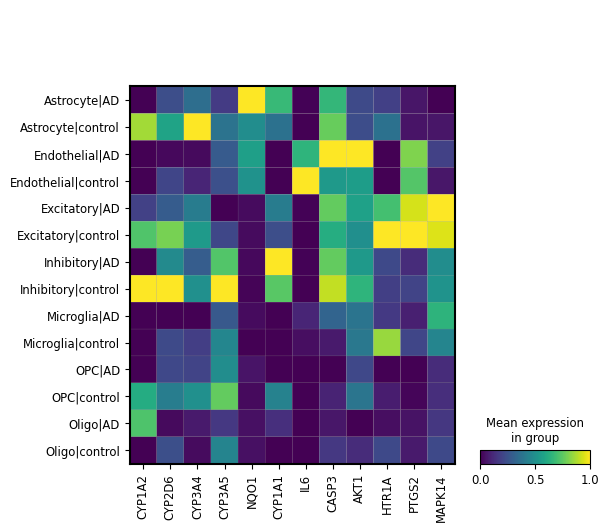

In [37]:
import scanpy as sc

adata.obs["ct_cond"] = (adata.obs["celltype"].astype(str) + "|" + adata.obs["condition"].astype(str)).astype("category")

sc.pl.matrixplot(
    adata,
    var_names=found,
    groupby="ct_cond",
    standard_scale="var",
    cmap="viridis"
)

In [38]:
import numpy as np
import pandas as pd
import scipy.sparse as sp

# 用原始counts
X_goi = adata[:, found].layers["counts"]
if not sp.issparse(X_goi):
    X_goi = sp.csr_matrix(X_goi)

obs = adata.obs[["sample","condition","celltype","total_counts"]].copy()
obs["group"] = obs["sample"].astype(str) + "|" + obs["celltype"].astype(str)
groups = obs["group"].astype("category")
codes = groups.cat.codes.values
cats = groups.cat.categories

# group求和矩阵 G
G = sp.csr_matrix(
    (np.ones(adata.n_obs), (codes, np.arange(adata.n_obs))),
    shape=(len(cats), adata.n_obs)
)

pb_counts = (G @ X_goi)  # (n_groups, n_genes_of_interest)

pb = pd.DataFrame(pb_counts.toarray(), index=cats, columns=found)
pb["sample"] = pb.index.str.split("|").str[0]
pb["celltype"] = pb.index.str.split("|").str[1]
pb["condition"] = pb["sample"].map(adata.obs.groupby("sample")["condition"].first())

# 每个 group 贡献的细胞数、以及总UMI（用每细胞total_counts求和，避免全基因求和的开销）
pb["n_cells"] = pb.index.map(obs.groupby("group").size()).astype(int)
pb["libsize"] = pb.index.map(obs.groupby("group")["total_counts"].sum()).astype(float)

pb.head()

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\820151134.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pb["condition"] = pb["sample"].map(adata.obs.groupby("sample")["condition"].first())


,CYP1A2,CYP2D6,CYP3A4,CYP3A5,NQO1,CYP1A1,IL6,CASP3,AKT1,HTR1A,PTGS2,MAPK14,sample,celltype,condition,n_cells,libsize
GSM4775561_AD1|Astrocyte,0.0,10.0,3.0,5.0,16.0,0.0,0.0,24.0,40.0,0.0,3.0,121.0,GSM4775561_AD1,Astrocyte,AD,303,1598079.0
GSM4775561_AD1|Endothelial,0.0,0.0,0.0,3.0,7.0,0.0,7.0,4.0,12.0,0.0,1.0,16.0,GSM4775561_AD1,Endothelial,AD,66,177252.0
GSM4775561_AD1|Excitatory,0.0,95.0,9.0,36.0,46.0,2.0,1.0,214.0,388.0,3.0,81.0,1957.0,GSM4775561_AD1,Excitatory,AD,1697,16987530.0
GSM4775561_AD1|Inhibitory,0.0,35.0,5.0,77.0,18.0,1.0,0.0,137.0,175.0,0.0,18.0,662.0,GSM4775561_AD1,Inhibitory,AD,883,6970233.0
GSM4775561_AD1|Microglia,0.0,7.0,1.0,3.0,7.0,0.0,3.0,30.0,60.0,0.0,2.0,178.0,GSM4775561_AD1,Microglia,AD,392,1348880.0


In [39]:
from scipy.stats import mannwhitneyu

min_cells_per_group = 50  # 一个 sample×celltype 至少50细胞再纳入（可调）
pb2 = pb[pb["n_cells"] >= min_cells_per_group].copy()

# logCPM
for g in found:
    pb2[g + "_logcpm"] = np.log1p((pb2[g] / pb2["libsize"]) * 1e6)

rows = []
for ct in sorted(pb2["celltype"].unique()):
    dct = pb2[pb2["celltype"] == ct]
    for g in found:
        x = dct.loc[dct["condition"]=="AD", g + "_logcpm"]
        y = dct.loc[dct["condition"]=="control", g + "_logcpm"]
        if len(x) >= 3 and len(y) >= 3:  # 至少有一定样本数才检验
            p = mannwhitneyu(x, y, alternative="two-sided").pvalue
            fc = float(x.median() - y.median())  # logCPM差（AD - control）
        else:
            p, fc = np.nan, np.nan
        rows.append([ct, g, len(x), len(y), fc, p])

res = pd.DataFrame(rows, columns=["celltype","gene","n_AD","n_control","median_logcpm_diff(AD-control)","pval"])
res = res.sort_values(["celltype","pval"])
display(res)

,celltype,gene,n_AD,n_control,median_logcpm_diff(AD-control),pval
1,Astrocyte,CYP2D6,12,9,-0.198502,0.050586
2,Astrocyte,CYP3A4,12,9,-0.601732,0.055051
7,Astrocyte,CASP3,12,9,0.148389,0.240955
0,Astrocyte,CYP1A2,12,9,0.000000,0.289839
8,Astrocyte,AKT1,12,9,0.081581,0.413774
...,...,...,...,...,...,...
75,Oligo,CYP3A5,11,9,0.027613,0.594853
81,Oligo,HTR1A,11,9,0.000000,0.703674
79,Oligo,CASP3,11,9,-0.095104,0.819708
78,Oligo,IL6,11,9,0.000000,0.884059


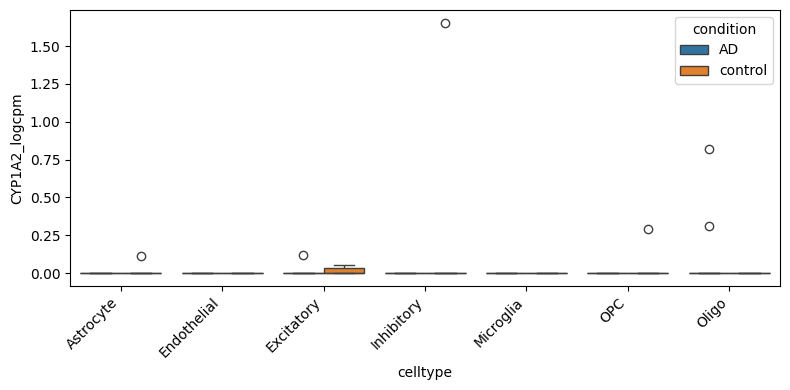

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

plot_gene = found[0]  # 先改成你最关心的，比如 "IL6" 或 "HTR1A"
dfp = pb2[["celltype","condition", plot_gene + "_logcpm"]].copy()

plt.figure(figsize=(8,4))
sns.boxplot(data=dfp, x="celltype", y=plot_gene + "_logcpm", hue="condition")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [41]:
import pandas as pd

genes = ["CYP1A2","CYP2D6","CYP3A4","CYP3A5","NQO1","CYP1A1",
         "IL6","CASP3","AKT1","HTR1A","PTGS2","MAPK14"]

var_upper = pd.Index(adata.var_names.str.upper())
genes_found, genes_missing = [], []

for g in genes:
    gu = g.upper()
    if gu in var_upper:
        genes_found.append(adata.var_names[var_upper.get_loc(gu)])
    else:
        genes_missing.append(g)

print("Found:", genes_found)
print("Missing:", genes_missing)

Found: ['CYP1A2', 'CYP2D6', 'CYP3A4', 'CYP3A5', 'NQO1', 'CYP1A1', 'IL6', 'CASP3', 'AKT1', 'HTR1A', 'PTGS2', 'MAPK14']
Missing: []


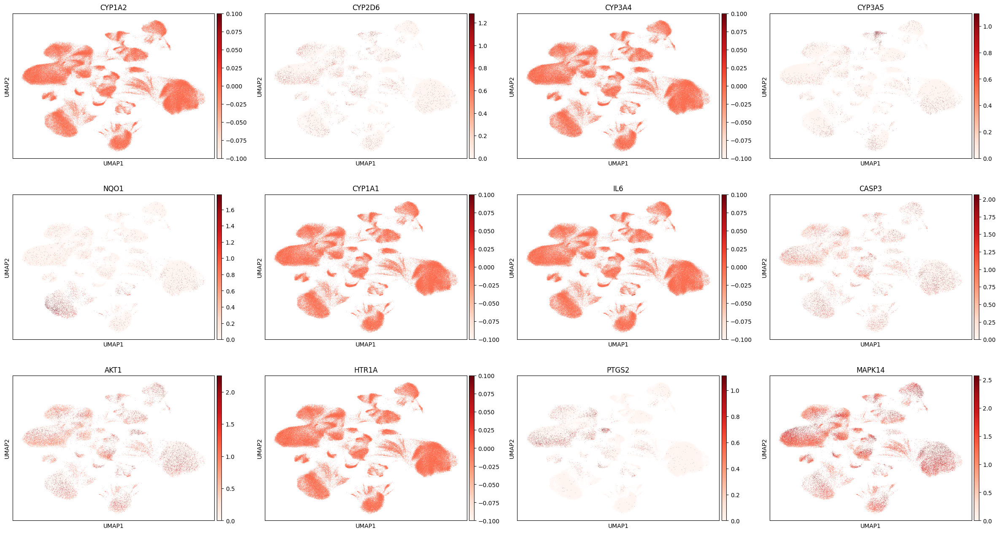

In [42]:
import scanpy as sc

sc.pl.umap(
    adata,
    color=genes_found,
    use_raw=True,
    ncols=4,               # 12个基因会分成3行×4列
    cmap="Reds",
    vmin=0,
    vmax="p99",            # 用99分位截断，避免极端值把颜色拉爆
)

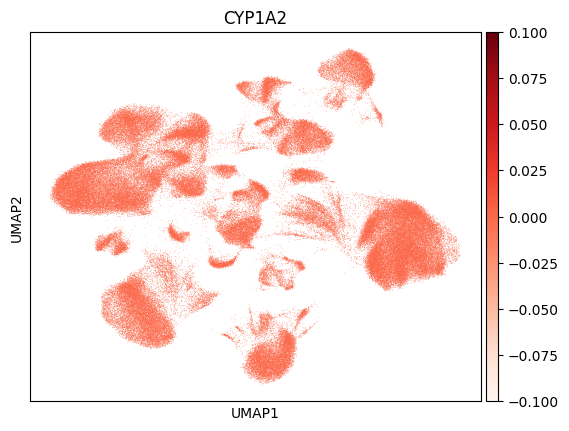

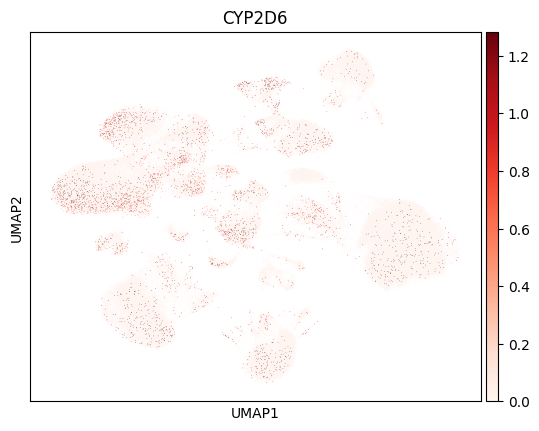

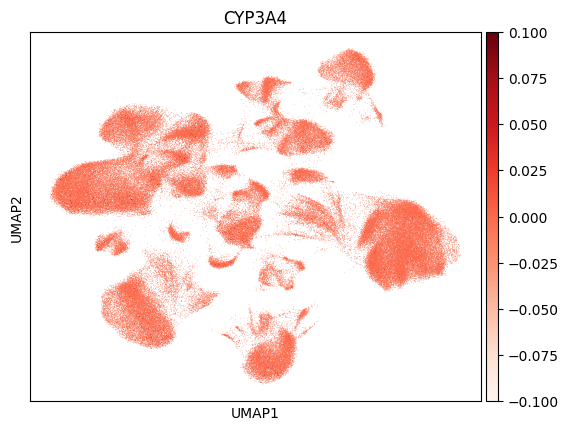

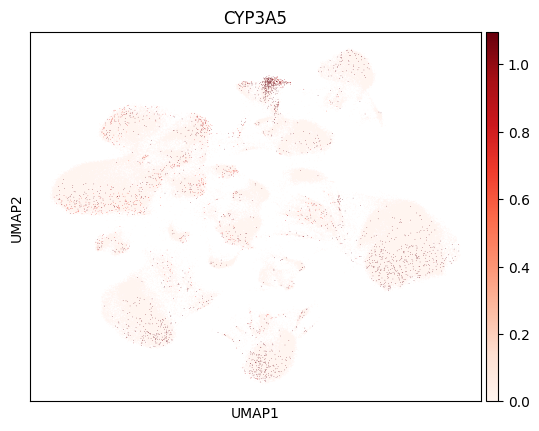

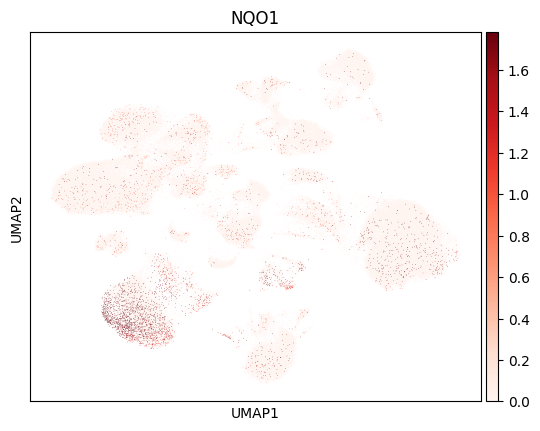

...

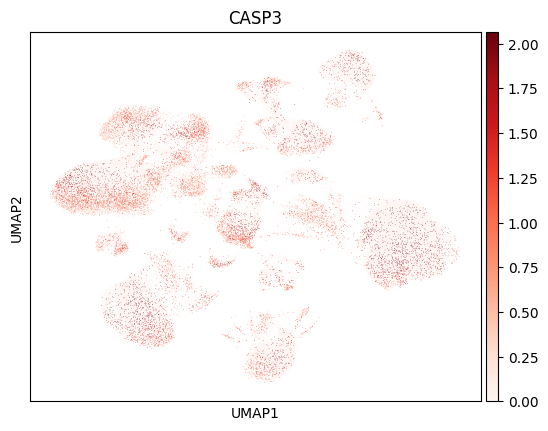

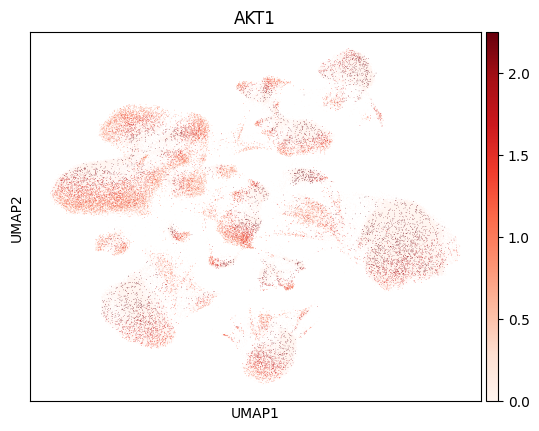

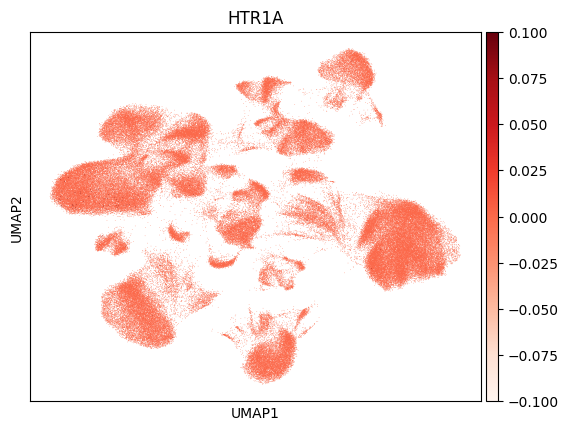

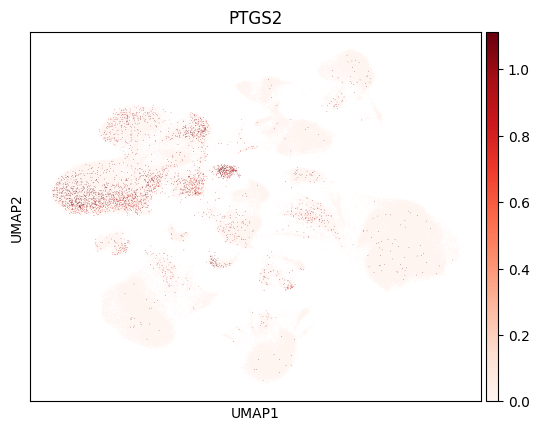

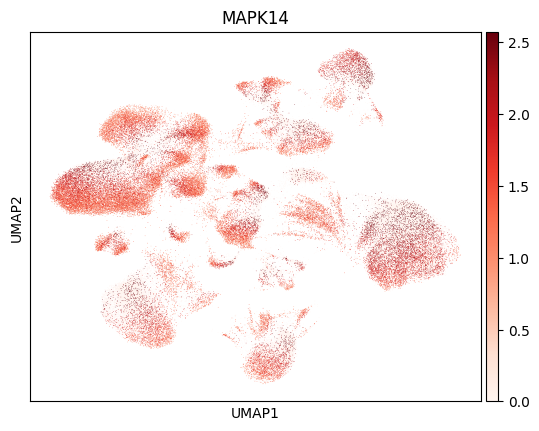

In [43]:
import scanpy as sc

sc.settings.figdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures"
sc.settings.file_format_figs = "png"

for g in genes_found:
    sc.pl.umap(
        adata,
        color=g,
        use_raw=True,
        cmap="Reds",
        vmin=0,
        vmax="p99",
        save=f"_expr_{g}"    # 保存为 figures/umap_expr_{g}.png
    )

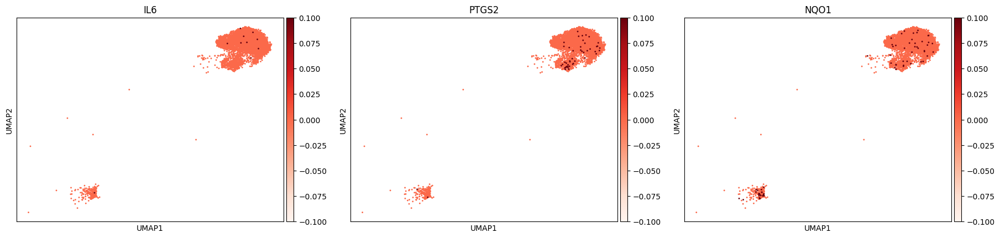

In [44]:
sub = adata[adata.obs["celltype"] == "Microglia"].copy()

sc.pl.umap(
    sub,
    color=["IL6","PTGS2","NQO1"],
    use_raw=True,
    ncols=3,
    cmap="Reds",
    vmin=0,
    vmax="p99",
)

In [45]:
import scanpy as sc
import pandas as pd
import numpy as np

# 图片输出目录
sc.settings.figdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures"
sc.settings.file_format_figs = "png"

# 确保 raw 存在（用来画基因表达/做打分）
if adata.raw is None:
    adata.raw = adata

layers = {
    "Xenobiotic_metabolism_oxidative_stress": ["CYP1A1","CYP1A2","CYP2D6","CYP3A4","CYP3A5","NQO1"],
    "Inflammation_prostaglandin": ["IL6","PTGS2"],
    "Apoptosis_stress_signaling": ["CASP3","AKT1","MAPK14"],
    "Neuroactive_signaling": ["HTR1A"],
}

# 基因存在性检查（大小写不敏感），并生成“可用基因列表”
var_upper = pd.Index(adata.raw.var_names.str.upper())
layer_genes_found = {}
layer_genes_missing = {}

for layer, genes in layers.items():
    found, missing = [], []
    for g in genes:
        gu = g.upper()
        if gu in var_upper:
            real = adata.raw.var_names[var_upper.get_loc(gu)]
            found.append(real)
        else:
            missing.append(g)
    layer_genes_found[layer] = found
    layer_genes_missing[layer] = missing

print("=== Genes found by layer ===")
for k,v in layer_genes_found.items():
    print(k, ":", v)

print("\n=== Genes missing by layer ===")
for k,v in layer_genes_missing.items():
    if len(v)>0:
        print(k, ":", v)

=== Genes found by layer ===
Xenobiotic_metabolism_oxidative_stress : ['CYP1A1', 'CYP1A2', 'CYP2D6', 'CYP3A4', 'CYP3A5', 'NQO1']
Inflammation_prostaglandin : ['IL6', 'PTGS2']
Apoptosis_stress_signaling : ['CASP3', 'AKT1', 'MAPK14']
Neuroactive_signaling : ['HTR1A']

=== Genes missing by layer ===


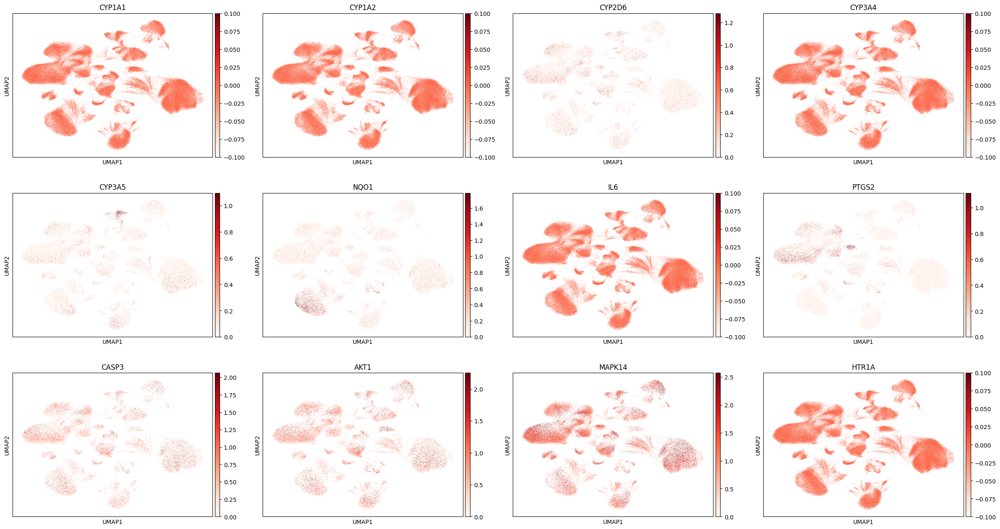

In [46]:
all_found = sum(layer_genes_found.values(), [])

sc.pl.umap(
    adata,
    color=all_found,
    use_raw=True,
    ncols=4,
    cmap="Reds",
    vmin=0,
    vmax="p99",
    save="_MPsGutAD_12genes_featureplot_grid"
)

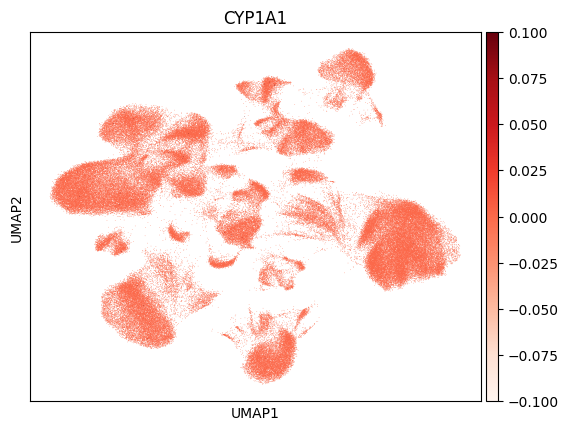

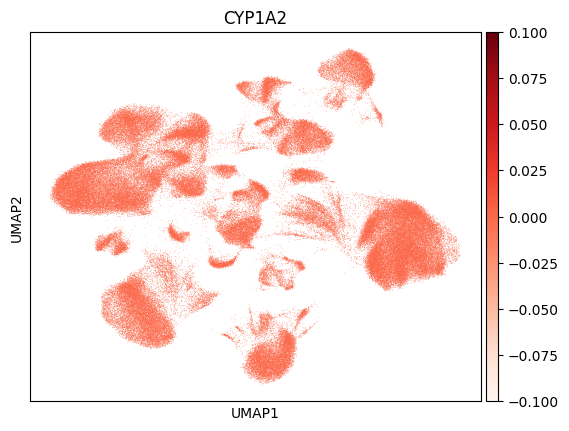

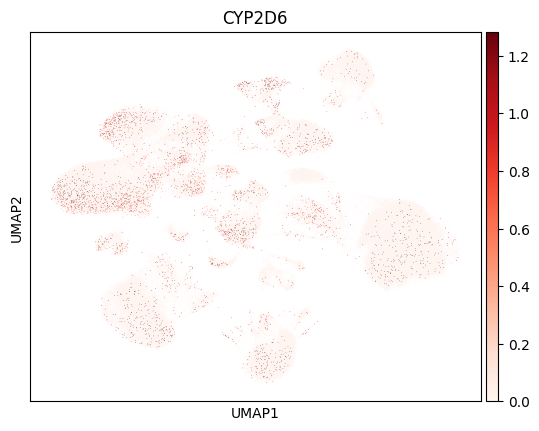

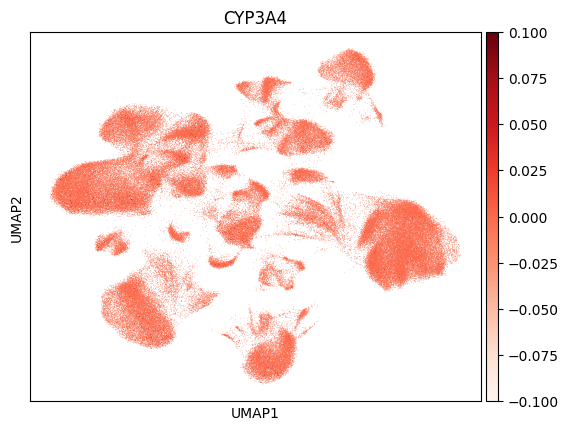

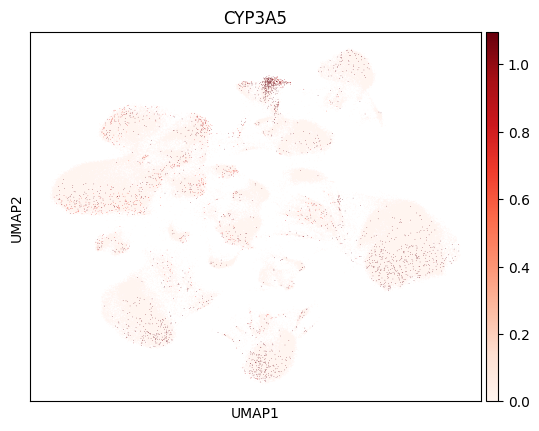

...

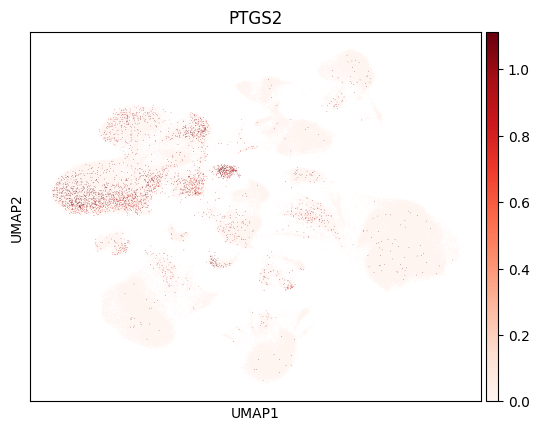

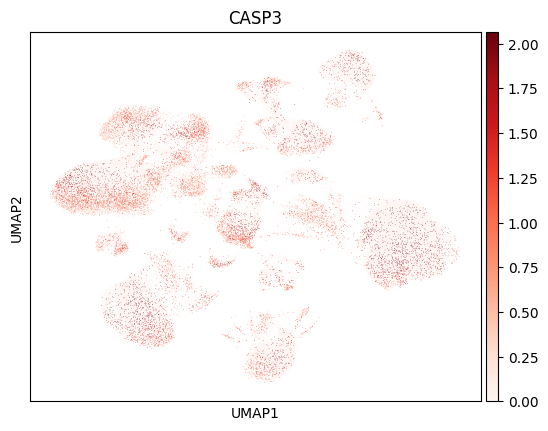

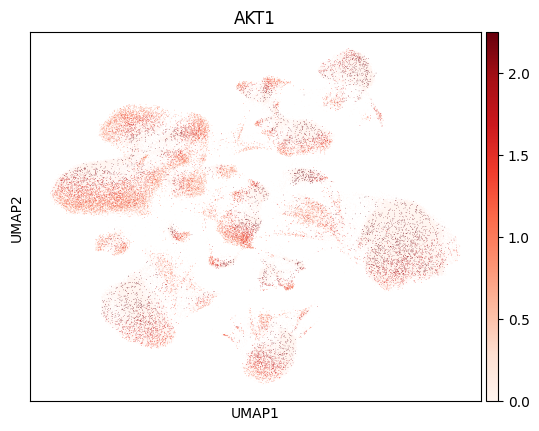

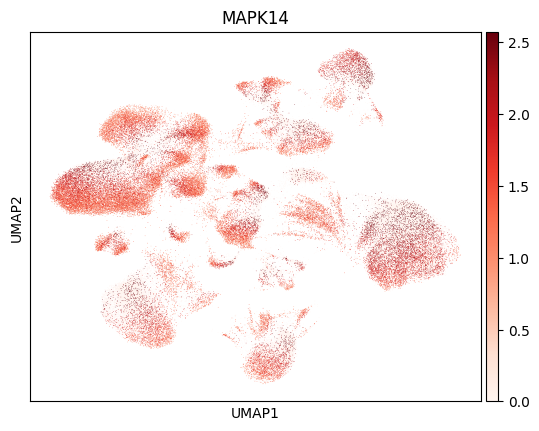

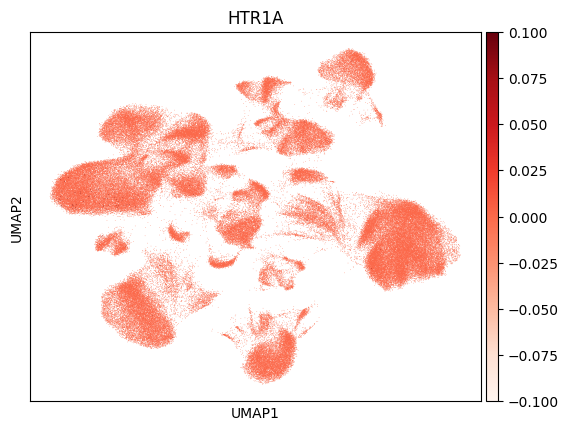

In [47]:
for g in all_found:
    sc.pl.umap(
        adata,
        color=g,
        use_raw=True,
        cmap="Reds",
        vmin=0,
        vmax="p99",
        save=f"_MPsGutAD_expr_{g}"
    )

C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds

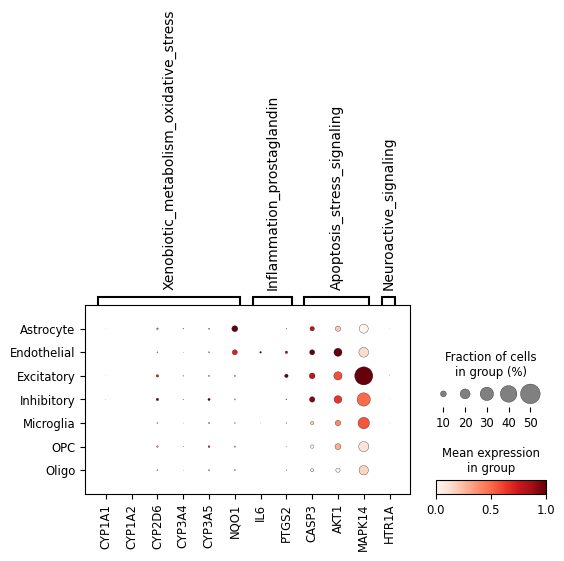

In [48]:
sc.pl.dotplot(
    adata,
    var_names={k:v for k,v in layer_genes_found.items() if len(v)>0},
    groupby="celltype",
    use_raw=True,
    standard_scale="var",
    save="_MPsGutAD_dotplot_byCelltype"
)

In [49]:
# 计算每个 layer 的 score，写入 adata.obs
for layer, genes in layer_genes_found.items():
    if len(genes) == 0:
        print(f"[skip] {layer}: no genes found in dataset")
        continue
    score_name = f"score_{layer}"
    sc.tl.score_genes(adata, gene_list=genes, score_name=score_name, use_raw=True)
    print("done:", score_name, "using", len(genes), "genes")

done: score_Xenobiotic_metabolism_oxidative_stress using 6 genes
done: score_Inflammation_prostaglandin using 2 genes
done: score_Apoptosis_stress_signaling using 3 genes
done: score_Neuroactive_signaling using 1 genes


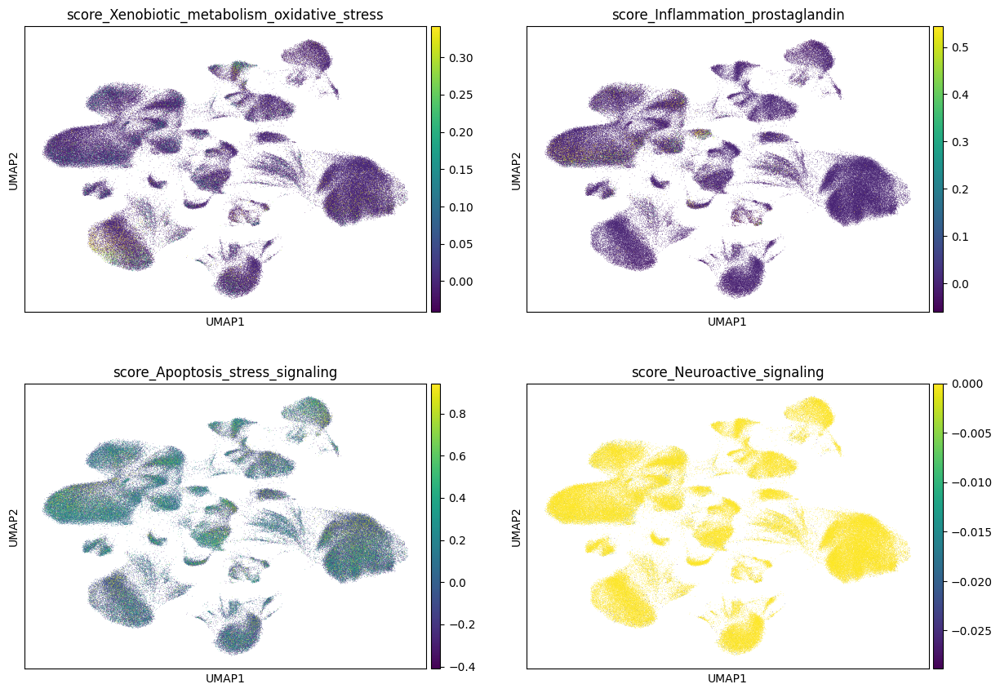

In [50]:
score_cols = [c for c in adata.obs.columns if c.startswith("score_")]

sc.pl.umap(
    adata,
    color=score_cols,
    cmap="viridis",
    vmin="p1",
    vmax="p99",
    ncols=2,
    save="_MPsGutAD_layerScores_umap"
)

In [51]:
score_cols = [c for c in adata.obs.columns if c.startswith("score_")]

df = adata.obs[["sample","condition","celltype"] + score_cols].copy()
agg = df.groupby(["sample","condition","celltype"])[score_cols].mean().reset_index()

out_agg = r"C:\Users\13918\Desktop\Aging2\GEO\MPsGutAD_layerScores_sampleCelltype_mean.csv"
agg.to_csv(out_agg, index=False)
print("Saved:", out_agg)

Saved: C:\Users\13918\Desktop\Aging2\GEO\MPsGutAD_layerScores_sampleCelltype_mean.csv


C:\Users\13918\AppData\Local\Temp\ipykernel_79396\3271937312.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg = df.groupby(["sample","condition","celltype"])[score_cols].mean().reset_index()


In [52]:
import pandas as pd
import numpy as np

score_cols = [c for c in adata.obs.columns if c.startswith("score_")]

df = adata.obs[["sample","condition","celltype"] + score_cols].copy()

# 关键：observed=True，只保留实际出现过的组合
agg = (df.groupby(["sample","condition","celltype"], observed=True)[score_cols]
         .mean()
         .reset_index())

print("agg shape:", agg.shape)
print("Any NA in scores?:", agg[score_cols].isna().any().any())
agg.head()

agg shape: (146, 7)
Any NA in scores?: False


,sample,condition,celltype,score_Xenobiotic_metabolism_oxidative_stress,score_Inflammation_prostaglandin,score_Apoptosis_stress_signaling,score_Neuroactive_signaling
0,GSM4775561_AD1,AD,Astrocyte,0.003635,-0.011293,-0.036051,-0.001046
1,GSM4775561_AD1,AD,Endothelial,0.014025,-0.006337,0.001563,-0.001186
2,GSM4775561_AD1,AD,Excitatory,-0.000200,0.009573,-0.000193,0.000380
3,GSM4775561_AD1,AD,Inhibitory,0.004760,-0.005968,0.016479,-0.000630
4,GSM4775561_AD1,AD,Microglia,-0.011922,-0.015776,0.075777,-0.000961


In [ ]:
# df["condition"] = df["condition"].astype(str)
# df["celltype"]  = df["celltype"].astype(str)

In [53]:
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

rows = []
for ct in sorted(agg["celltype"].unique()):
    d = agg[agg["celltype"] == ct]
    for sc_name in score_cols:
        x = d.loc[d["condition"]=="AD", sc_name].dropna()
        y = d.loc[d["condition"]=="control", sc_name].dropna()

        # 至少有一定样本数才检验
        if len(x) >= 3 and len(y) >= 3:
            p = mannwhitneyu(x, y, alternative="two-sided").pvalue
            diff = float(x.median() - y.median())   # AD - control（中位数差）
        else:
            p, diff = np.nan, np.nan

        rows.append([ct, sc_name, len(x), len(y), diff, p])

res = pd.DataFrame(rows, columns=[
    "celltype","score","n_AD","n_control","median_diff(AD-control)","pval"
])

# FDR（对全部 celltype×score 一起校正）
ok = res["pval"].notna()
res.loc[ok, "fdr"] = multipletests(res.loc[ok, "pval"], method="fdr_bh")[1]

res = res.sort_values(["fdr","pval"])
display(res)

,celltype,score,n_AD,n_control,median_diff(AD-control),pval,fdr
6,Endothelial,score_Apoptosis_stress_signaling,12,9,0.043820,0.020906,0.281807
10,Excitatory,score_Apoptosis_stress_signaling,12,9,0.023022,0.020906,0.281807
2,Astrocyte,score_Apoptosis_stress_signaling,12,9,0.012227,0.030194,0.281807
24,Oligo,score_Xenobiotic_metabolism_oxidative_stress,12,9,-0.001766,0.059663,0.417644
11,Excitatory,score_Neuroactive_signaling,12,9,-0.000558,0.094905,0.531468
1,Astrocyte,score_Inflammation_prostaglandin,12,9,0.003367,0.145152,0.677375
8,Excitatory,score_Xenobiotic_metabolism_oxidative_stress,12,9,-0.001069,0.213621,0.764117
20,OPC,score_Xenobiotic_metabolism_oxidative_stress,12,9,-0.003104,0.270663,0.764117
22,OPC,score_Apoptosis_stress_signaling,12,9,0.015809,0.270663,0.764117
4,Endothelial,score_Xenobiotic_metabolism_oxidative_stress,12,9,-0.001685,0.302789,0.764117


In [54]:
out_res = r"C:\Users\13918\Desktop\Aging2\GEO\MPsGutAD_layerScores_ADvsControl_stats.csv"
res.to_csv(out_res, index=False)
print("Saved:", out_res)

Saved: C:\Users\13918\Desktop\Aging2\GEO\MPsGutAD_layerScores_ADvsControl_stats.csv


C:\Users\13918\AppData\Local\Temp\ipykernel_79396\53452757.py:7: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=agg, x="celltype", y=sc_name, hue="condition",


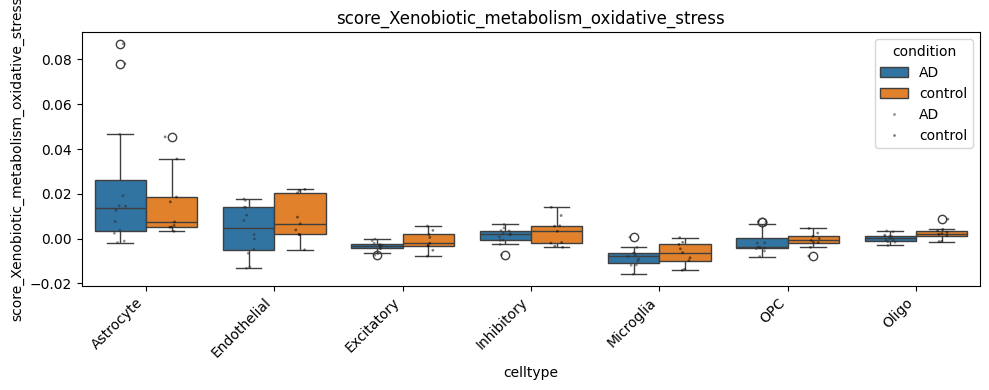

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\53452757.py:7: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=agg, x="celltype", y=sc_name, hue="condition",


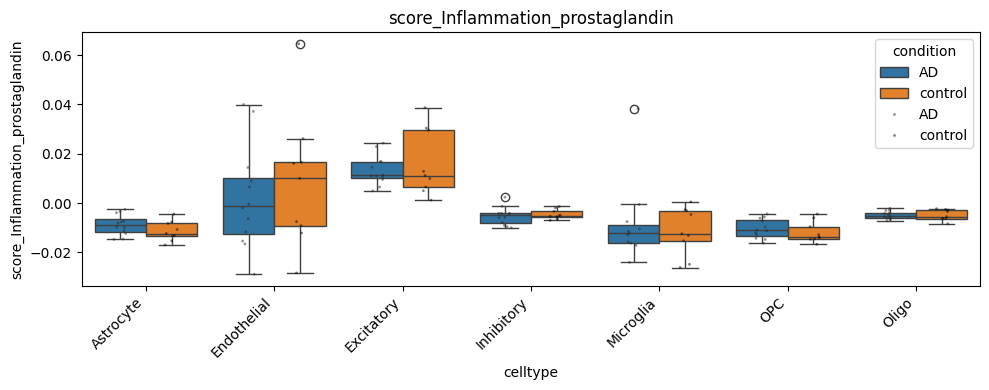

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\53452757.py:7: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=agg, x="celltype", y=sc_name, hue="condition",


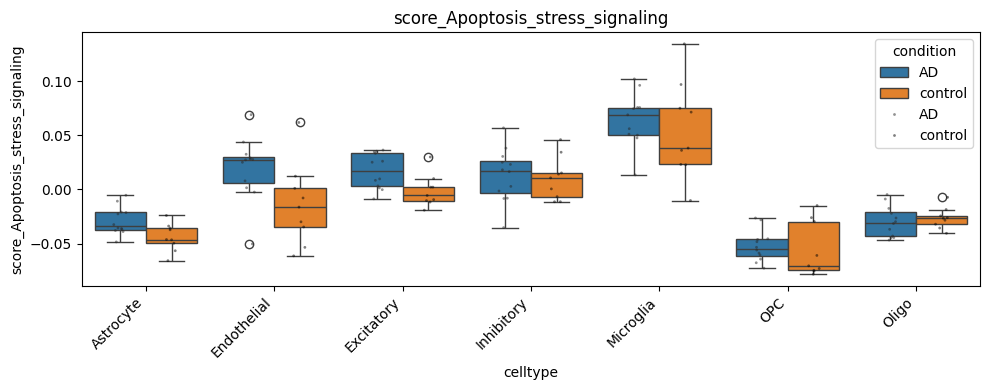

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\53452757.py:7: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=agg, x="celltype", y=sc_name, hue="condition",


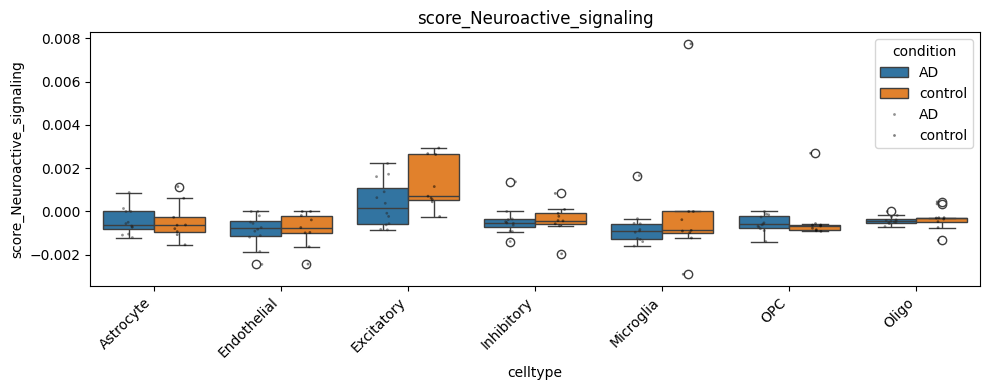

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

for sc_name in score_cols:
    plt.figure(figsize=(10,4))
    sns.boxplot(data=agg, x="celltype", y=sc_name, hue="condition")
    sns.stripplot(data=agg, x="celltype", y=sc_name, hue="condition",
                  dodge=True, color="k", size=2, alpha=0.5)
    plt.xticks(rotation=45, ha="right")
    plt.title(sc_name)
    plt.tight_layout()
    plt.show()

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:16: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


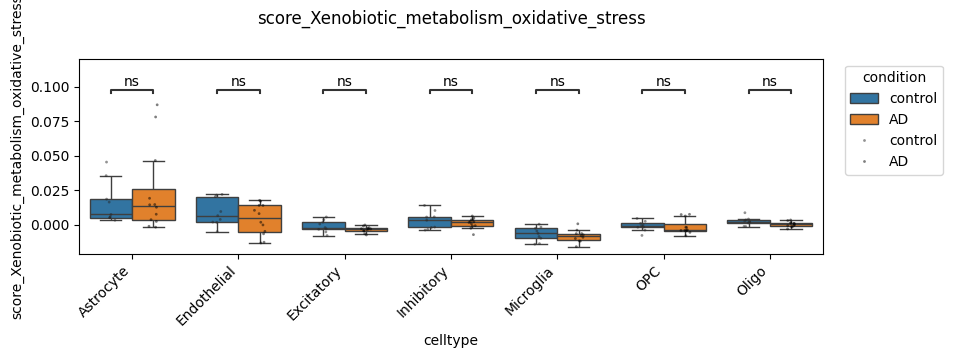

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:16: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


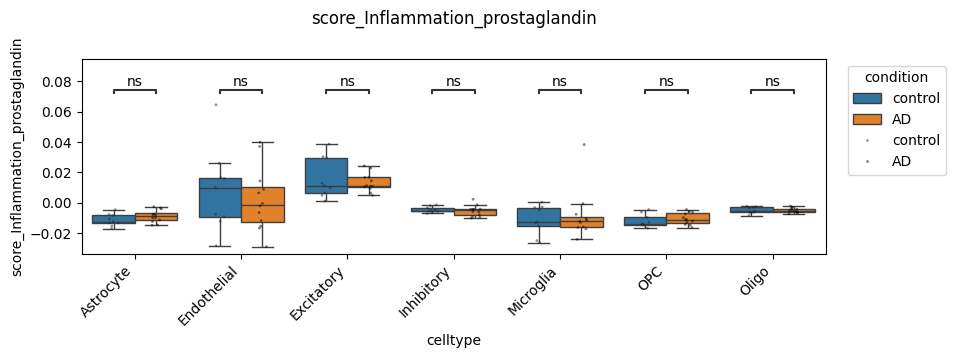

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:16: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


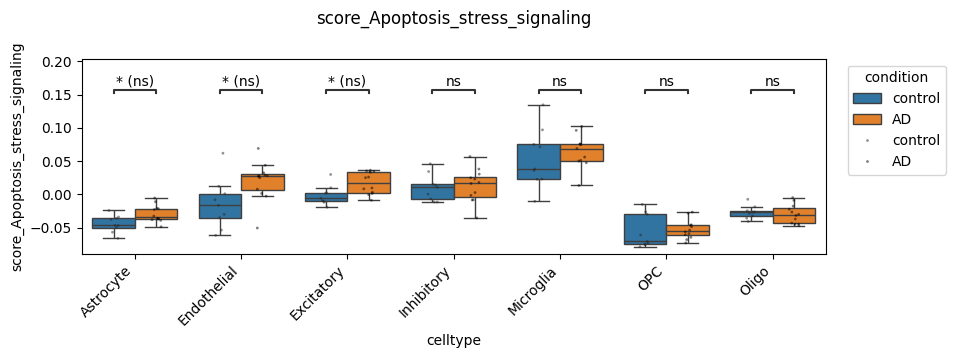

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:16: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1217677582.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


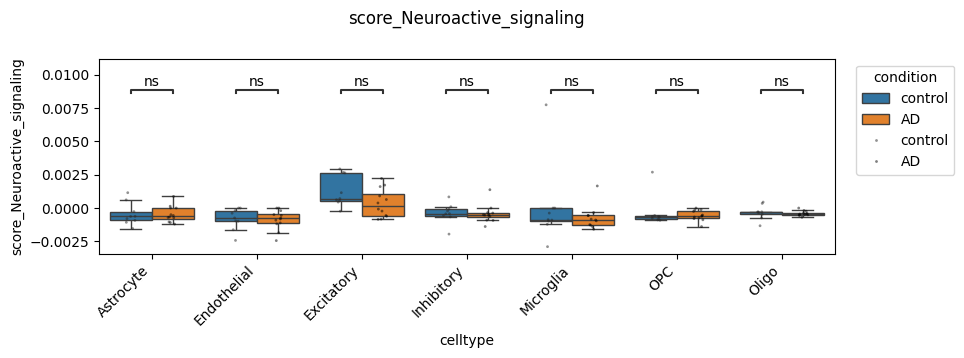

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

celltype_order = ["Astrocyte","Endothelial","Excitatory","Inhibitory","Microglia","OPC","Oligo"]
hue_order = ["control", "AD"]

for sc_name in score_cols:
    fig, ax = plt.subplots(figsize=(11,4))

    sns.boxplot(
        data=agg, x="celltype", y=sc_name,
        order=celltype_order, hue="condition", hue_order=hue_order,
        showfliers=False, ax=ax
    )
    sns.stripplot(
        data=agg, x="celltype", y=sc_name,
        order=celltype_order, hue="condition", hue_order=hue_order,
        dodge=True, color="k", size=2, alpha=0.5, ax=ax
    )

    # 去掉重复legend（保留一个）
    ax.legend_.remove()
    ax.legend(title="condition", bbox_to_anchor=(1.02, 1), loc="upper left")

    pairs = [((ct, "control"), (ct, "AD")) for ct in celltype_order]
    annotator = Annotator(
        ax, pairs,
        data=agg, x="celltype", y=sc_name,
        order=celltype_order,
        hue="condition", hue_order=hue_order
    )
    annotator.configure(
        test="Mann-Whitney",
        text_format="star",
        comparisons_correction="BH",
        loc="outside",   # 放外面就要给上方留空间
        verbose=0
    )
    annotator.apply_and_annotate()

    # 关键1：把y轴上方加高，给ns/**留位置（适用于有负值的score）
    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.25*(y1 - y0))   # 额外加 25% 高度，你可调 0.2~0.4

    # 关键2：标题往上挪（pad越大越往上），避免压到标注
    ax.set_title(sc_name, pad=25)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

    # 关键3：给顶部留白（rect的最后一个值越小，顶部留白越多）
    plt.tight_layout(rect=[0, 0, 0.88, 0.92])
    plt.show()

In [60]:
plt.close("all")

In [62]:
import pandas as pd

genes = ["PTGS2", "HTR1A"]
var_upper = pd.Index(adata.raw.var_names.str.upper() if adata.raw is not None else adata.var_names.str.upper())
var_names = adata.raw.var_names if adata.raw is not None else adata.var_names

found = []
missing = []
for g in genes:
    gu = g.upper()
    if gu in var_upper:
        found.append(var_names[var_upper.get_loc(gu)])
    else:
        missing.append(g)

print("Found:", found)
print("Missing:", missing)

Found: ['PTGS2', 'HTR1A']
Missing: []


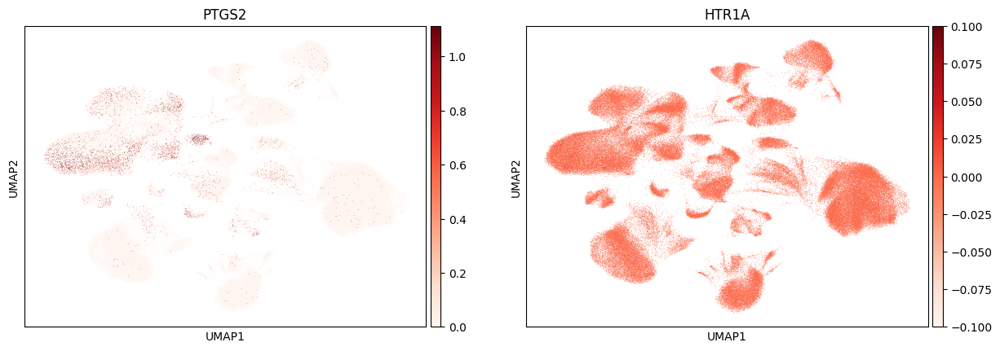

In [63]:
import scanpy as sc

sc.pl.umap(
    adata,
    color=found,
    use_raw=True,
    cmap="Reds",
    vmin=0,
    vmax="p99",
    ncols=2
)

In [64]:
import numpy as np
import pandas as pd
import scipy.sparse as sp

X = adata.raw[:, found].X  # log-normalized
if sp.issparse(X):
    X = X.toarray()

expr = pd.DataFrame(X, columns=found, index=adata.obs_names)
expr["sample"] = adata.obs["sample"].values
expr["condition"] = adata.obs["condition"].values
expr["celltype"] = adata.obs["celltype"].values

# 总体（每个sample一个值）
overall_mean = expr.groupby(["sample","condition"], observed=True)[found].mean().reset_index()
overall_det  = expr.assign(**{g+"_det": (expr[g] > 0).astype(int) for g in found}) \
                  .groupby(["sample","condition"], observed=True)[[g+"_det" for g in found]].mean().reset_index()

display(overall_mean.head())
display(overall_det.head())

,sample,condition,PTGS2,HTR1A
0,GSM4775561_AD1,AD,0.018296,0.000365
1,GSM4775562_AD2,AD,0.019919,0.000753
2,GSM4775563_AD4,AD,0.023725,0.000351
3,GSM4775564_AD5,AD,0.023316,0.000000
4,GSM4775565_AD6,AD,0.011008,0.000000


,sample,condition,PTGS2_det,HTR1A_det
0,GSM4775561_AD1,AD,0.017556,0.000516
1,GSM4775562_AD2,AD,0.018546,0.000745
2,GSM4775563_AD4,AD,0.014907,0.000351
3,GSM4775564_AD5,AD,0.015878,0.000000
4,GSM4775565_AD6,AD,0.006787,0.000000


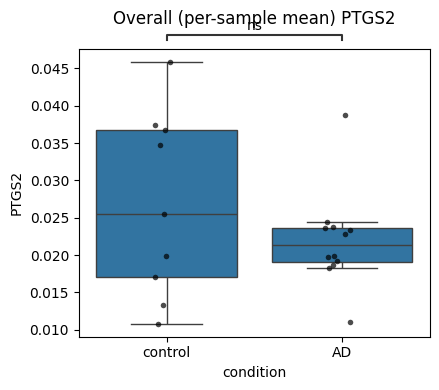

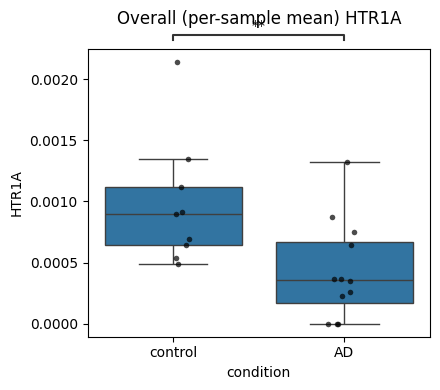

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

for g in found:
    fig, ax = plt.subplots(figsize=(4.5,4))
    sns.boxplot(data=overall_mean, x="condition", y=g, order=["control","AD"], ax=ax, showfliers=False)
    sns.stripplot(data=overall_mean, x="condition", y=g, order=["control","AD"], ax=ax, color="k", size=4, alpha=0.7)

    pairs = [("control", "AD")]
    annot = Annotator(ax, pairs, data=overall_mean, x="condition", y=g, order=["control","AD"])
    annot.configure(test="Mann-Whitney", text_format="star", loc="outside", verbose=0)
    annot.apply_and_annotate()

    ax.set_title(f"Overall (per-sample mean) {g}", pad=18)
    plt.tight_layout()
    plt.show()

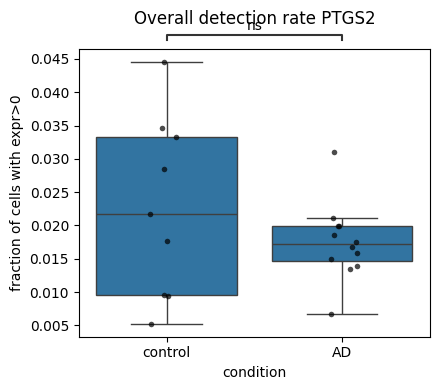

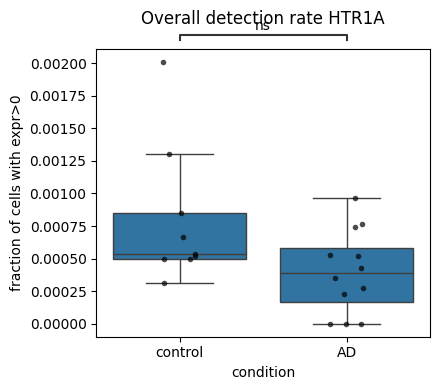

In [66]:
for g in found:
    col = g + "_det"
    fig, ax = plt.subplots(figsize=(4.5,4))
    sns.boxplot(data=overall_det, x="condition", y=col, order=["control","AD"], ax=ax, showfliers=False)
    sns.stripplot(data=overall_det, x="condition", y=col, order=["control","AD"], ax=ax, color="k", size=4, alpha=0.7)

    pairs = [("control", "AD")]
    annot = Annotator(ax, pairs, data=overall_det, x="condition", y=col, order=["control","AD"])
    annot.configure(test="Mann-Whitney", text_format="star", loc="outside", verbose=0)
    annot.apply_and_annotate()

    ax.set_title(f"Overall detection rate {g}", pad=18)
    ax.set_ylabel("fraction of cells with expr>0")
    plt.tight_layout()
    plt.show()

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1939105096.py:10: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1939105096.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


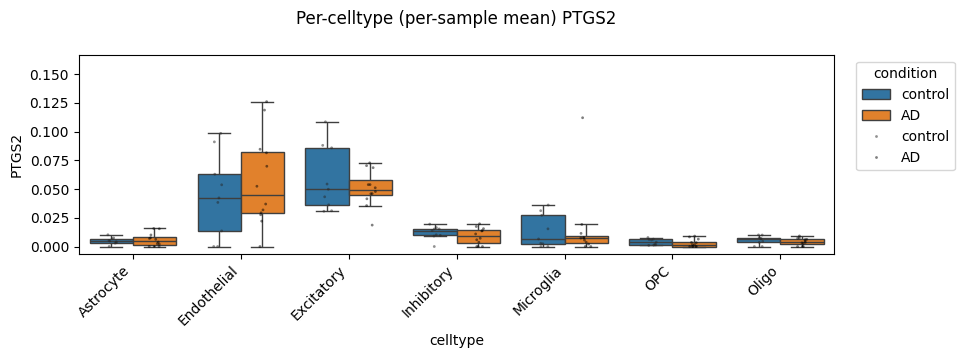

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1939105096.py:10: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,
C:\Users\13918\AppData\Local\Temp\ipykernel_79396\1939105096.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


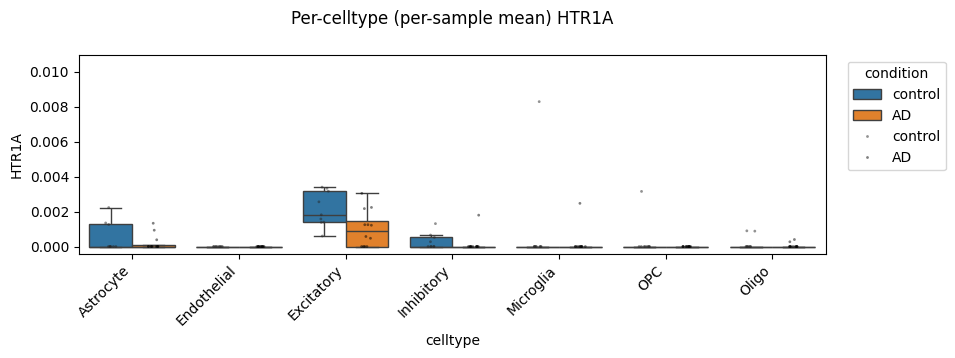

In [67]:
by_ct_mean = expr.groupby(["sample","condition","celltype"], observed=True)[found].mean().reset_index()

celltype_order = ["Astrocyte","Endothelial","Excitatory","Inhibitory","Microglia","OPC","Oligo"]
hue_order = ["control","AD"]

for g in found:
    fig, ax = plt.subplots(figsize=(11,4))
    sns.boxplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,
                hue="condition", hue_order=hue_order, showfliers=False, ax=ax)
    sns.stripplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,
                  hue="condition", hue_order=hue_order, dodge=True, color="k", size=2, alpha=0.5, ax=ax)

    ax.legend_.remove()
    ax.legend(title="condition", bbox_to_anchor=(1.02, 1), loc="upper left")

    pairs = [((ct, "control"), (ct, "AD")) for ct in celltype_order]
    annot = Annotator(ax, pairs, data=by_ct_mean, x="celltype", y=g,
                      order=celltype_order, hue="condition", hue_order=hue_order)
    annot.configure(test="Mann-Whitney", comparisons_correction="BH",
                    text_format="star", loc="outside",
                    hide_non_significant=True, verbose=0)
    annot.apply_and_annotate()

    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.25*(y1-y0))
    ax.set_title(f"Per-celltype (per-sample mean) {g}", pad=22)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    plt.tight_layout(rect=[0,0,0.88,0.92])
    plt.show()

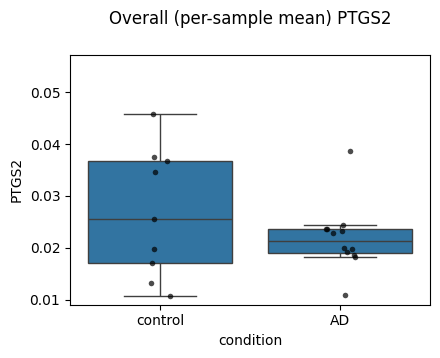

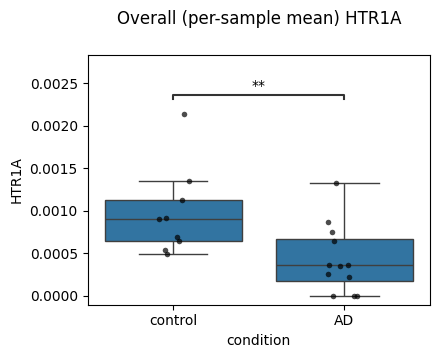

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

for g in found:
    fig, ax = plt.subplots(figsize=(4.5,4))

    sns.boxplot(data=overall_mean, x="condition", y=g, order=["control","AD"],
                ax=ax, showfliers=False)
    sns.stripplot(data=overall_mean, x="condition", y=g, order=["control","AD"],
                  ax=ax, color="k", size=4, alpha=0.7)

    pairs = [("control", "AD")]
    annot = Annotator(ax, pairs, data=overall_mean, x="condition", y=g, order=["control","AD"])
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="outside",
        hide_non_significant=True,  # 关键：不显示ns，就不会和标题抢位置
        verbose=0
    )
    annot.apply_and_annotate()

    # 关键：给外侧标注留空间
    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.25*(y1-y0))
    ax.set_title(f"Overall (per-sample mean) {g}", pad=22)

    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\406457102.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Endothelial_control vs. Endothelial_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.955e-01 U_stat=4.800e+01
Astrocyte_control vs. Astrocyte_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.000e+00 U_stat=5.450e+01
Excitatory_control vs. Excitatory_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.036e-01 U_stat=5.800e+01
Inhibitory_control vs. Inhibitory_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:3.540e-01 U_stat=6.750e+01
Microglia_control vs. Microglia_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.788e-01 U_stat=5.200e+01
OPC_control vs. OPC_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg corre

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\406457102.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


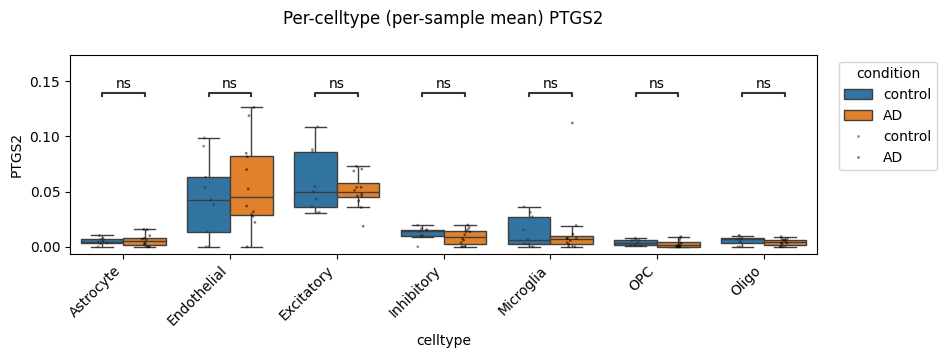

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\406457102.py:13: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:k'` for the same effect.

  sns.stripplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Endothelial_control vs. Endothelial_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.000e+00 U_stat=5.400e+01
Astrocyte_control vs. Astrocyte_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.040e-01 U_stat=6.200e+01
Excitatory_control vs. Excitatory_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.390e-02 (ns) U_stat=8.900e+01
Inhibitory_control vs. Inhibitory_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.059e-01 U_stat=7.150e+01
Microglia_control vs. Microglia_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.841e-01 U_stat=5.100e+01
OPC_control vs. OPC_AD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg 

C:\Users\13918\AppData\Local\Temp\ipykernel_79396\406457102.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


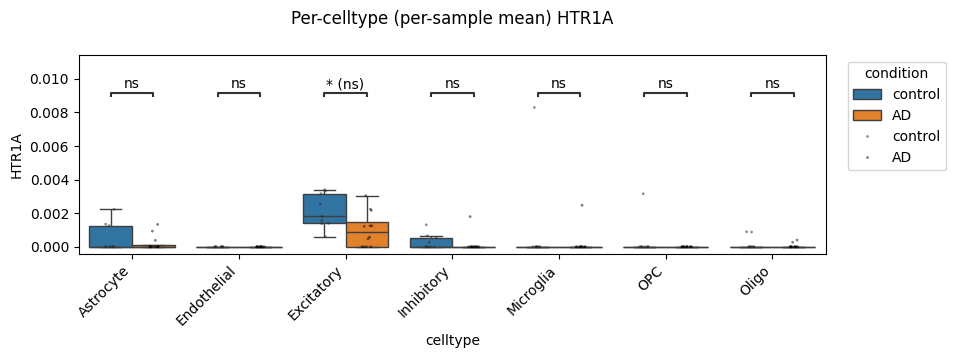

In [69]:
from statannotations.Annotator import Annotator
import seaborn as sns
import matplotlib.pyplot as plt

celltype_order = ["Astrocyte","Endothelial","Excitatory","Inhibitory","Microglia","OPC","Oligo"]
hue_order = ["control","AD"]

for g in found:
    fig, ax = plt.subplots(figsize=(11,4))

    sns.boxplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,
                hue="condition", hue_order=hue_order, showfliers=False, ax=ax)
    sns.stripplot(data=by_ct_mean, x="celltype", y=g, order=celltype_order,
                  hue="condition", hue_order=hue_order, dodge=True,
                  color="k", size=2, alpha=0.5, ax=ax)

    ax.legend_.remove()
    ax.legend(title="condition", bbox_to_anchor=(1.02, 1), loc="upper left")

    pairs = [((ct, "control"), (ct, "AD")) for ct in celltype_order]
    annot = Annotator(ax, pairs, data=by_ct_mean, x="celltype", y=g,
                      order=celltype_order, hue="condition", hue_order=hue_order)
    annot.configure(
        test="Mann-Whitney",
        comparisons_correction="BH",
        text_format="star",
        loc="outside",
        hide_non_significant=False,  # 先别隐藏，确认是不是全ns
        verbose=1                    # 打印每个比较的p值/结果
    )
    annot.apply_and_annotate()

    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.30*(y1-y0))
    ax.set_title(f"Per-celltype (per-sample mean) {g}", pad=22)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    plt.tight_layout(rect=[0,0,0.88,0.92])
    plt.show()

In [70]:
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

genes = found  # 你现在的found如果包含多个基因，就直接用

# 1) 每个样本的平均表达（log-normalized，来自 adata.raw）
overall_mean = expr.groupby(["sample","condition"], observed=True)[genes].mean().reset_index()

# 2) 每个样本的检测率（表达>0的细胞比例）
det_cols = []
tmp = expr.copy()
for g in genes:
    col = f"{g}_det"
    tmp[col] = (tmp[g] > 0).astype(int)
    det_cols.append(col)

overall_det = tmp.groupby(["sample","condition"], observed=True)[det_cols].mean().reset_index()

# 3) 统计检验（Mann–Whitney），并计算中位数差（AD-control）
rows = []
for g in genes:
    x = overall_mean.loc[overall_mean["condition"]=="AD", g].dropna()
    y = overall_mean.loc[overall_mean["condition"]=="control", g].dropna()
    p = mannwhitneyu(x, y, alternative="two-sided").pvalue if (len(x)>=3 and len(y)>=3) else np.nan
    diff = float(x.median() - y.median()) if (len(x)>0 and len(y)>0) else np.nan
    rows.append(["mean", g, len(x), len(y), diff, p])

for g in genes:
    col = f"{g}_det"
    x = overall_det.loc[overall_det["condition"]=="AD", col].dropna()
    y = overall_det.loc[overall_det["condition"]=="control", col].dropna()
    p = mannwhitneyu(x, y, alternative="two-sided").pvalue if (len(x)>=3 and len(y)>=3) else np.nan
    diff = float(x.median() - y.median()) if (len(x)>0 and len(y)>0) else np.nan
    rows.append(["det_rate", g, len(x), len(y), diff, p])

res_overall = pd.DataFrame(rows, columns=["metric","gene","n_AD","n_control","median_diff(AD-control)","pval"])

# BH-FDR（分别对 mean 和 det_rate 校正更直观）
for m in res_overall["metric"].unique():
    idx = (res_overall["metric"]==m) & res_overall["pval"].notna()
    res_overall.loc[idx, "fdr"] = multipletests(res_overall.loc[idx, "pval"], method="fdr_bh")[1]

res_overall = res_overall.sort_values(["metric","fdr","pval"])
display(res_overall)

out_csv = r"C:\Users\13918\Desktop\Aging2\GEO\overall_gene_ADvsControl_stats.csv"
res_overall.to_csv(out_csv, index=False)
print("Saved:", out_csv)

,metric,gene,n_AD,n_control,median_diff(AD-control),pval,fdr
3,det_rate,HTR1A,12,9,-0.000147,0.069591,0.139182
2,det_rate,PTGS2,12,9,-0.004576,0.374360,0.374360
1,mean,HTR1A,12,9,-0.000541,0.009396,0.018791
0,mean,PTGS2,12,9,-0.004133,0.545798,0.545798


Saved: C:\Users\13918\Desktop\Aging2\GEO\overall_gene_ADvsControl_stats.csv


In [71]:
import os

outdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures\overall_genes"
os.makedirs(outdir, exist_ok=True)

for g in genes:
    fig, ax = plt.subplots(figsize=(4.5,4))
    sns.boxplot(data=overall_mean, x="condition", y=g, order=["control","AD"], ax=ax, showfliers=False)
    sns.stripplot(data=overall_mean, x="condition", y=g, order=["control","AD"], ax=ax, color="k", size=4, alpha=0.7)

    annot = Annotator(ax, [("control","AD")], data=overall_mean, x="condition", y=g, order=["control","AD"])
    annot.configure(test="Mann-Whitney", text_format="star", loc="outside", hide_non_significant=True, verbose=0)
    annot.apply_and_annotate()

    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.25*(y1-y0))
    ax.set_title(f"Overall (per-sample mean) {g}", pad=22)
    plt.tight_layout(rect=[0, 0, 1, 0.92])

    fig.savefig(os.path.join(outdir, f"overall_mean_{g}.png"), dpi=300, bbox_inches="tight")
    plt.close(fig)

Found: ['CYP1A2', 'CYP2D6', 'CYP3A4', 'CYP3A5', 'NQO1', 'CYP1A1', 'IL6', 'CASP3', 'AKT1', 'HTR1A', 'PTGS2', 'MAPK14']
Missing: []


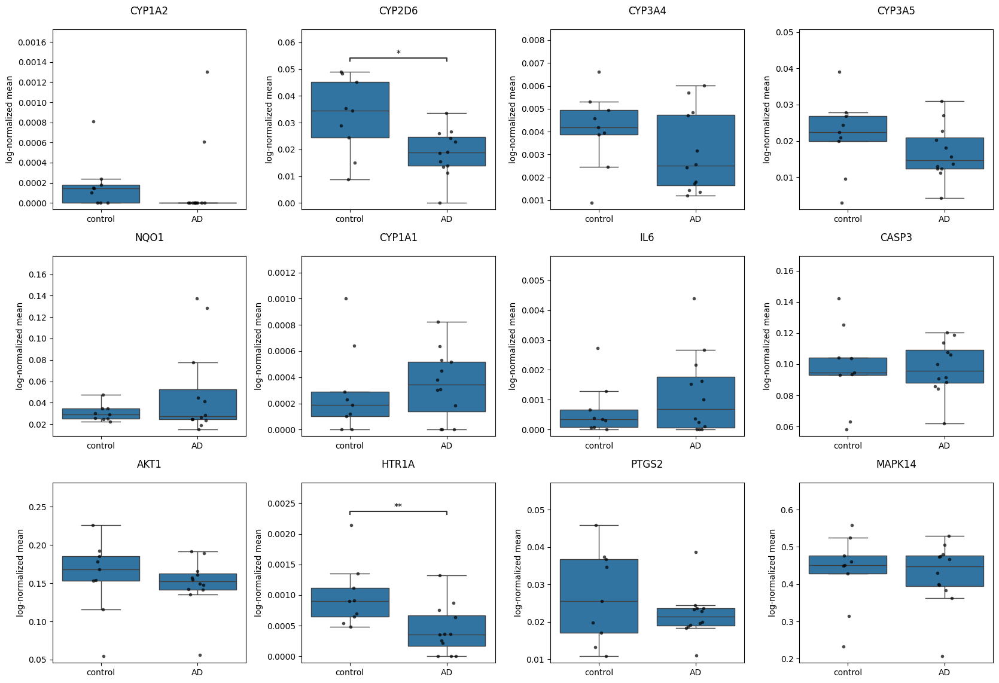

In [72]:
import numpy as np
import pandas as pd
import scipy.sparse as sp
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

# 你的12个基因
genes12 = [
    "CYP1A2","CYP2D6","CYP3A4","CYP3A5","NQO1","CYP1A1",
    "IL6","CASP3","AKT1","HTR1A","PTGS2","MAPK14"
]

# 1) 找到在adata.raw里真实存在的基因名（大小写不敏感）
if adata.raw is None:
    raise ValueError("adata.raw is None，请先保证你做过 adata.raw = adata（log-normalized之后）")

var_upper = pd.Index(adata.raw.var_names.str.upper())
found_real = []
missing = []
for g in genes12:
    gu = g.upper()
    if gu in var_upper:
        found_real.append(adata.raw.var_names[var_upper.get_loc(gu)])
    else:
        missing.append(g)

print("Found:", found_real)
print("Missing:", missing)

# 2) 取表达并算 overall_mean（每个sample一个均值）
X = adata.raw[:, found_real].X  # log-normalized
if sp.issparse(X):
    X = X.toarray()

expr = pd.DataFrame(X, columns=found_real)
expr["sample"] = adata.obs["sample"].values
expr["condition"] = adata.obs["condition"].values

overall_mean = expr.groupby(["sample","condition"], observed=True)[found_real].mean().reset_index()

# 3) 画12宫格：每个基因一个小图 + 星号
n = len(found_real)
ncols = 4
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4.2*ncols, 4*nrows))
axes = np.array(axes).reshape(-1)

for i, g in enumerate(found_real):
    ax = axes[i]

    sns.boxplot(
        data=overall_mean, x="condition", y=g,
        order=["control","AD"], showfliers=False, ax=ax
    )
    sns.stripplot(
        data=overall_mean, x="condition", y=g,
        order=["control","AD"], color="k", size=4, alpha=0.7, ax=ax
    )

    annot = Annotator(ax, [("control","AD")],
                      data=overall_mean, x="condition", y=g, order=["control","AD"])
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="outside",
        hide_non_significant=True,  # 不显示ns（避免和标题挤）
        verbose=0
    )
    annot.apply_and_annotate()

    # 给外侧标注留空间
    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.25*(y1 - y0))

    ax.set_title(g, pad=18)
    ax.set_xlabel("")
    ax.set_ylabel("log-normalized mean")

# 多余子图删掉
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [73]:
import os
import numpy as np
import pandas as pd
import scipy.sparse as sp
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

outdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures\overall_12genes"
os.makedirs(outdir, exist_ok=True)

genes12 = [
    "CYP1A2","CYP2D6","CYP3A4","CYP3A5","NQO1","CYP1A1",
    "IL6","CASP3","AKT1","HTR1A","PTGS2","MAPK14"
]

# ---- 1) 找到数据中真实存在的基因名（大小写不敏感）----
if adata.raw is None:
    raise ValueError("adata.raw is None，请先在log1p后设置：adata.raw = adata")

var_upper = pd.Index(adata.raw.var_names.str.upper())
found_real, missing = [], []
for g in genes12:
    gu = g.upper()
    if gu in var_upper:
        found_real.append(adata.raw.var_names[var_upper.get_loc(gu)])
    else:
        missing.append(g)

print("Found:", found_real)
print("Missing:", missing)

# ---- 2) 计算 overall_mean：每个 sample 的平均表达（log-normalized）----
X = adata.raw[:, found_real].X
if sp.issparse(X):
    X = X.toarray()

expr = pd.DataFrame(X, columns=found_real)
expr["sample"] = adata.obs["sample"].values
expr["condition"] = adata.obs["condition"].values

overall_mean = expr.groupby(["sample","condition"], observed=True)[found_real].mean().reset_index()

# ---- 3) 逐基因画图 + 显著性 + 保存 ----
for g in found_real:
    fig, ax = plt.subplots(figsize=(4.5, 4))

    sns.boxplot(
        data=overall_mean, x="condition", y=g,
        order=["control", "AD"], showfliers=False, ax=ax
    )
    sns.stripplot(
        data=overall_mean, x="condition", y=g,
        order=["control", "AD"], color="k", size=4, alpha=0.7, ax=ax
    )

    annot = Annotator(ax, [("control","AD")],
                      data=overall_mean, x="condition", y=g, order=["control","AD"])
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="outside",
        hide_non_significant=True,
        verbose=0
    )
    annot.apply_and_annotate()

    # 给外侧标注留空间
    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.25*(y1-y0))

    ax.set_title(f"Overall (per-sample mean) {g}", pad=22)
    ax.set_xlabel("")
    ax.set_ylabel("log-normalized mean")

    plt.tight_layout(rect=[0, 0, 1, 0.92])

    out_png = os.path.join(outdir, f"overall_mean_{g}.png")
    fig.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.close(fig)

print("Saved to:", outdir)

Found: ['CYP1A2', 'CYP2D6', 'CYP3A4', 'CYP3A5', 'NQO1', 'CYP1A1', 'IL6', 'CASP3', 'AKT1', 'HTR1A', 'PTGS2', 'MAPK14']
Missing: []
Saved to: C:\Users\13918\Desktop\Aging2\GEO\figures\overall_12genes


In [74]:
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator

out_png = r"C:\Users\13918\Desktop\Aging2\GEO\figures\overall_12genes_grid.png"
os.makedirs(os.path.dirname(out_png), exist_ok=True)

n = len(found_real)
ncols = 4
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4.2*ncols, 4*nrows))
axes = np.array(axes).reshape(-1)

for i, g in enumerate(found_real):
    ax = axes[i]

    sns.boxplot(data=overall_mean, x="condition", y=g, order=["control","AD"],
                showfliers=False, ax=ax)
    sns.stripplot(data=overall_mean, x="condition", y=g, order=["control","AD"],
                  color="k", size=4, alpha=0.7, ax=ax)

    annot = Annotator(ax, [("control","AD")],
                      data=overall_mean, x="condition", y=g, order=["control","AD"])
    annot.configure(test="Mann-Whitney", text_format="star",
                    loc="outside", hide_non_significant=True, verbose=0)
    annot.apply_and_annotate()

    y0, y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.25*(y1-y0))
    ax.set_title(g, pad=18)
    ax.set_xlabel("")
    ax.set_ylabel("")

# 删除多余子图
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.savefig(out_png, dpi=300, bbox_inches="tight")
plt.close(fig)

print("Saved:", out_png)

Saved: C:\Users\13918\Desktop\Aging2\GEO\figures\overall_12genes_grid.png


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


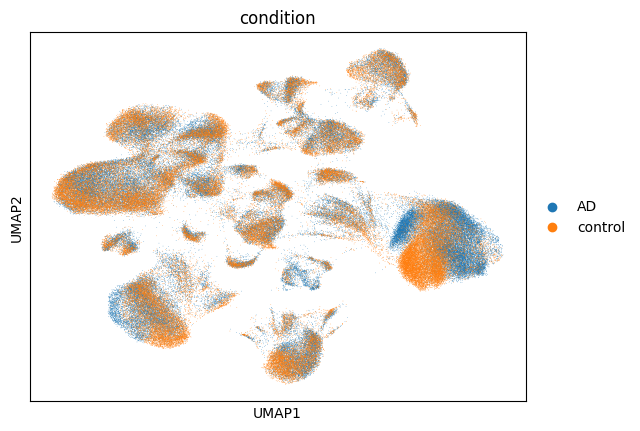

In [75]:
import scanpy as sc

sc.settings.figdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures"
sc.settings.file_format_figs = "png"

sc.pl.umap(adata, color="condition", save="_condition_AD_vs_control")

In [76]:
import numpy as np
import scanpy as sc

score_cols = [c for c in adata.obs.columns if c.startswith("score_")]

for s in score_cols:
    # 用全体细胞的分位数固定颜色范围，保证 AD vs control 可比
    vmin = float(np.quantile(adata.obs[s].values, 0.01))
    vmax = float(np.quantile(adata.obs[s].values, 0.99))

    for cond in ["control", "AD"]:
        sub = adata[adata.obs["condition"] == cond].copy()  # copy避免view警告
        sc.pl.umap(
            sub,
            color=s,
            cmap="viridis",
            vmin=vmin,
            vmax=vmax,
            show=False,
            save=f"_{s}_{cond}"
        )

In [77]:
import scanpy as sc
import matplotlib

print("scanpy:", sc.__version__)
print("matplotlib:", matplotlib.__version__)

scanpy: 1.9.6
matplotlib: 3.9.4


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


C:\Users\13918\miniconda3\envs\scrna_npc\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


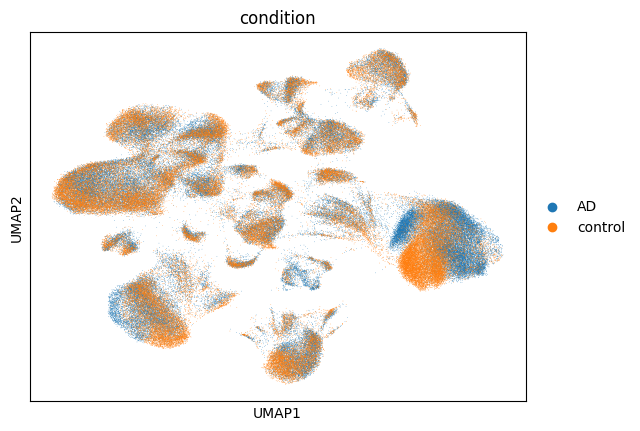

In [78]:
import scanpy as sc
sc.settings.figdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures"
sc.settings.file_format_figs = "png"

# 可能会因为legend报错；先试这个
try:
    sc.pl.umap(adata, color="condition", save="_condition")
except Exception as e:
    print("Legend issue, fallback to legend_loc='none':", e)
    sc.pl.umap(adata, color="condition", legend_loc="none", save="_condition_nolegend")

In [79]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc

outdir = r"C:\Users\13918\Desktop\Aging2\GEO\figures\layerScores_AD_vs_control"
os.makedirs(outdir, exist_ok=True)

score_cols = [c for c in adata.obs.columns if c.startswith("score_")]
conds = ["control", "AD"]   # 你的 condition 就是这两个值

for s in score_cols:
    vmin = float(np.quantile(adata.obs[s].values, 0.01))
    vmax = float(np.quantile(adata.obs[s].values, 0.99))

    fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)

    for ax, cond in zip(axs, conds):
        sub = adata[adata.obs["condition"] == cond].copy()
        sc.pl.umap(
            sub,
            color=s,
            cmap="viridis",
            vmin=vmin,
            vmax=vmax,
            ax=ax,
            show=False
        )
        ax.set_title(f"{s}\n{cond}")

    out_png = os.path.join(outdir, f"UMAP_{s}_AD_vs_control.png")
    fig.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.close(fig)

print("Saved to:", outdir)

Saved to: C:\Users\13918\Desktop\Aging2\GEO\figures\layerScores_AD_vs_control
